In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import timeit
from sklearn.model_selection import train_test_split,GridSearchCV
from sklearn.feature_selection import f_regression, mutual_info_regression
from sklearn.linear_model import LinearRegression, Ridge, Lasso
from sklearn.metrics import r2_score,mean_squared_error
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.preprocessing import MinMaxScaler
from sklearn.svm import SVR
from sklearn.ensemble import GradientBoostingRegressor

pd.set_option('display.max_rows', None)  # Muestra todas las filas

In [56]:
datos1=pd.read_excel('datos1.xlsx')
datos2=pd.read_excel('datos2.xlsx')
datos3=pd.read_excel('datos3.xlsx')
datos4=pd.read_excel('datos4.xlsx')
datos5=pd.read_excel('datos5.xlsx')

datos = pd.concat([datos1,
                   datos2,
                   datos3,
                   datos4,
                   datos5]).drop_duplicates('Matricula', keep = 'last').reset_index(drop=True).drop(
    ['Versión','Distintivo Ambiental','Historial de revisiones','Estándar de calidad'], axis=1)

Las marcas Land Rover y Alfa Romeo no están bien codificadas ya que les falta la segunda palabra, que está incluida en el modelo. Se les añade a la marca y se eliminan del modelo

In [57]:
mapeo_marcas = {'Alfa': 'Alfa Romeo', 'Land': 'Land Rover'}

def transformar_marca(marca):
    return mapeo_marcas.get(marca, marca)

datos['Marca'] = datos['Marca'].apply(transformar_marca)

def transformar_modelo(marca, modelo):
    if marca == 'Alfa Romeo':
        return modelo.split(' ', 1)[1] if modelo.startswith('Romeo') else modelo
    elif marca == 'Land Rover':
        return modelo.split(' ', 1)[1] if modelo.startswith('Rover') else modelo
    else:
        return modelo

datos['Modelo'] = datos.apply(lambda row: transformar_modelo(row['Marca'], row['Modelo']), axis=1)

Tras algunos análisis, debido a que algunos marcas tienen modelos de coches con nombre iguales a los de otras marcas (Seat León y Cupra León), el modelo se va a construir como Marca concatenado con Modelo

In [58]:
datos['Modelo'] = datos['Marca'] + ' ' + datos['Modelo']

In [59]:
datos.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2411 entries, 0 to 2410
Data columns (total 28 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   Marca                             2411 non-null   object 
 1   Modelo                            2411 non-null   object 
 2   Precio                            2411 non-null   int64  
 3   Primera matriculación             2411 non-null   object 
 4   Kilometraje                       2411 non-null   object 
 5   Carburante                        2411 non-null   object 
 6   Transmisión                       2411 non-null   object 
 7   Potencia                          2411 non-null   object 
 8   Tracción                          2389 non-null   object 
 9   Tipo de vehículo                  2411 non-null   object 
 10  Puertas                           2409 non-null   float64
 11  Número de asientos                2411 non-null   int64  
 12  Color 

In [60]:
datos.isnull().sum()

Marca                                 0
Modelo                                0
Precio                                0
Primera matriculación                 0
Kilometraje                           0
Carburante                            0
Transmisión                           0
Potencia                              0
Tracción                             22
Tipo de vehículo                      0
Puertas                               2
Número de asientos                    0
Color                                 1
Tapicería                             3
Tipo de ruedas                      170
Motor original                        0
Cilindrada                            0
Consumo                             260
Clase de eficiencia CO2               0
Emisiones de CO2                    170
País de origen                        0
Número de llaves                      0
Coche accidentado y reparado        170
La última revisión se realizó el    263
Tipo de IVA                           0


In [61]:
datos = datos.dropna()
datos.reset_index(drop=True, inplace=True)

In [62]:
datos.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1924 entries, 0 to 1923
Data columns (total 28 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   Marca                             1924 non-null   object 
 1   Modelo                            1924 non-null   object 
 2   Precio                            1924 non-null   int64  
 3   Primera matriculación             1924 non-null   object 
 4   Kilometraje                       1924 non-null   object 
 5   Carburante                        1924 non-null   object 
 6   Transmisión                       1924 non-null   object 
 7   Potencia                          1924 non-null   object 
 8   Tracción                          1924 non-null   object 
 9   Tipo de vehículo                  1924 non-null   object 
 10  Puertas                           1924 non-null   float64
 11  Número de asientos                1924 non-null   int64  
 12  Color 

In [63]:
#primer paso: modificar variables para poder tratarlas
#las fechas se van a convertir en fechas de pandas y luego en días hasta hoy, para que sean números y se puedan comparar
datos['Primera matriculación'] = pd.to_datetime(datos['Primera matriculación'], format = '%d.%m.%Y')
datos['Días desde matriculación'] = (pd.Timestamp.now() - datos['Primera matriculación']).dt.days
datos['La última revisión se realizó el'] = pd.to_datetime(datos['La última revisión se realizó el'], format = '%d.%m.%Y')
datos['Días desde revisión'] = (pd.Timestamp.now() - datos['La última revisión se realizó el']).dt.days
datos['ITV válida hasta'] = pd.to_datetime(datos['ITV válida hasta'], format = '%d.%m.%Y')
datos['Días hasta ITV'] = (datos['ITV válida hasta'] - pd.Timestamp.now()).dt.days


In [64]:
#las variables numéricas
datos['Kilometraje'] = datos['Kilometraje'].str.replace(' km', '').str.replace('.','').astype(float)
datos['Potencia CV'] = datos['Potencia'].str.extract(r'(\d+) CV \/ (\d+) kW').iloc[:,0].astype(float)
datos['Cilindrada']  = datos['Cilindrada'].str.replace(' ccm', '').astype(float)
datos['Emisiones de CO2'] = datos['Emisiones de CO2'].str.replace(' g/km', '').astype(float)
datos['Puertas'] = datos['Puertas'].astype(int)
datos['Precio'] = datos['Precio'].astype(float)

#El consumo hay que partirlo en 3
partes = datos['Consumo'].str.split(')', expand=True)
datos['Consumo ciudad'] = partes.iloc[:,0].str.extract(r'(\d+(?:\.\d+)?) l\/100 km \(En la ciudad').astype(float)
datos['Consumo combinado'] = partes.iloc[:,1].str.extract(r'(\d+(?:\.\d+)?) l\/100 km \(Combinado').astype(float)

#arreglo de combinados que aparecen en la primera columna
incluir = partes.iloc[:,0].str.extract(r'(\d+(?:\.\d+)?) l\/100 km \(Combinado').astype(float)[0]
datos['Consumo combinado'] = datos['Consumo combinado'].combine_first(incluir)
datos['Consumo fuera'] = partes.iloc[:,2].str.extract(r'(\d+(?:\.\d+)?) l\/100 km \(Fuera de la ciudad').astype(float)

In [65]:
datos.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1924 entries, 0 to 1923
Data columns (total 35 columns):
 #   Column                            Non-Null Count  Dtype         
---  ------                            --------------  -----         
 0   Marca                             1924 non-null   object        
 1   Modelo                            1924 non-null   object        
 2   Precio                            1924 non-null   float64       
 3   Primera matriculación             1924 non-null   datetime64[ns]
 4   Kilometraje                       1924 non-null   float64       
 5   Carburante                        1924 non-null   object        
 6   Transmisión                       1924 non-null   object        
 7   Potencia                          1924 non-null   object        
 8   Tracción                          1924 non-null   object        
 9   Tipo de vehículo                  1924 non-null   object        
 10  Puertas                           1924 non-null 

In [66]:
datos.isnull().sum()

Marca                                0
Modelo                               0
Precio                               0
Primera matriculación                0
Kilometraje                          0
Carburante                           0
Transmisión                          0
Potencia                             0
Tracción                             0
Tipo de vehículo                     0
Puertas                              0
Número de asientos                   0
Color                                0
Tapicería                            0
Tipo de ruedas                       0
Motor original                       0
Cilindrada                           0
Consumo                              0
Clase de eficiencia CO2              0
Emisiones de CO2                     0
País de origen                       0
Número de llaves                     0
Coche accidentado y reparado         0
La última revisión se realizó el     0
Tipo de IVA                          0
ITV válida hasta         

Eliminamos los campos de Consumo y nos quedamos solo con el combinado

In [67]:
datos = datos.drop(['Consumo ciudad','Consumo fuera','Primera matriculación',
                    'La última revisión se realizó el','ITV válida hasta','Número de inventario'], axis=1)

In [68]:
datos.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1924 entries, 0 to 1923
Data columns (total 29 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   Marca                         1924 non-null   object 
 1   Modelo                        1924 non-null   object 
 2   Precio                        1924 non-null   float64
 3   Kilometraje                   1924 non-null   float64
 4   Carburante                    1924 non-null   object 
 5   Transmisión                   1924 non-null   object 
 6   Potencia                      1924 non-null   object 
 7   Tracción                      1924 non-null   object 
 8   Tipo de vehículo              1924 non-null   object 
 9   Puertas                       1924 non-null   int32  
 10  Número de asientos            1924 non-null   int64  
 11  Color                         1924 non-null   object 
 12  Tapicería                     1924 non-null   object 
 13  Tip

In [69]:
datos.describe().T

,count,mean,std,min,25%,50%,75%,max
Precio,1924.0,15630.185031,5969.871875,5799.0,11199.00,14399.0,18424.000,43899.0
Kilometraje,1924.0,73950.833160,38826.959899,202.0,42852.25,69649.0,102723.000,159645.0
Puertas,1924.0,4.810811,0.582790,2.0,5.00,5.0,5.000,6.0
Número de asientos,1924.0,5.008836,0.575478,2.0,5.00,5.0,5.000,9.0
Cilindrada,1924.0,1487.669958,372.391397,875.0,1199.00,1498.0,1598.000,2998.0
Emisiones de CO2,1924.0,118.062370,21.697904,1.0,106.00,115.0,129.000,226.0
Número de llaves,1924.0,1.823805,0.385157,1.0,2.00,2.0,2.000,4.0
Días desde matriculación,1924.0,2293.527547,897.584942,252.0,1652.50,2197.0,2915.000,4527.0
Días desde revisión,1924.0,142.205821,298.187100,19.0,48.00,76.0,118.000,3472.0
Días hasta ITV,1924.0,319.408004,239.957758,-691.0,132.00,304.5,508.000,1208.0


In [70]:
datos.groupby('Puertas').agg(Frecuencia=('Puertas', "count"))

,Frecuencia
Puertas,
2,29
3,90
4,99
5,1704
6,2


[Text(0.5, 0, 'Nº puertas')]

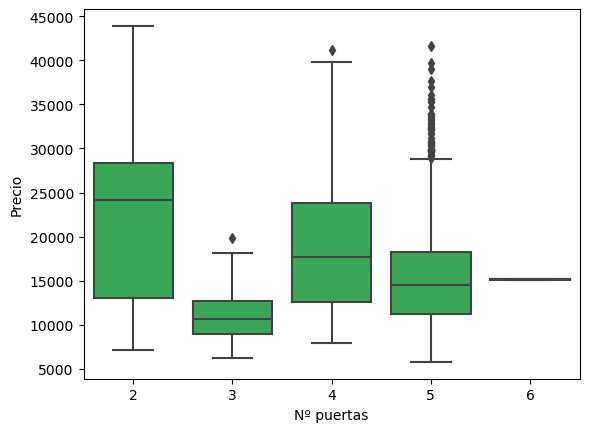

In [71]:
plot = sns.boxplot(x = 'Puertas', y = 'Precio', data = datos, color = '#28b84f')
plot.set( xlabel = 'Nº puertas')

In [72]:
datos.groupby('Número de asientos').agg(Frecuencia=('Número de asientos', "count"))

,Frecuencia
Número de asientos,
2,13
4,122
5,1706
7,74
8,6
9,3


[Text(0.5, 0, 'Nº asientos')]

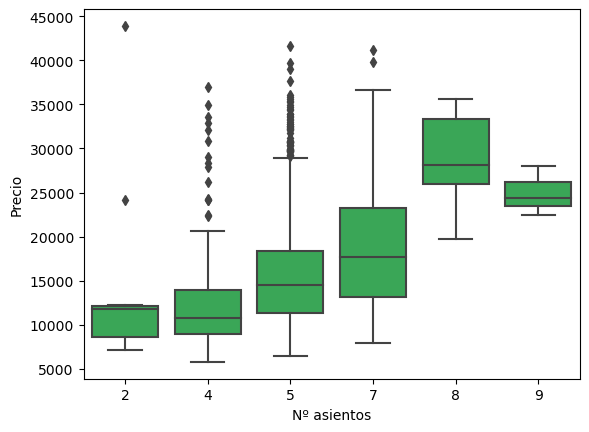

In [73]:
plot = sns.boxplot(x = 'Número de asientos', y = 'Precio', data = datos, color = '#28b84f')
plot.set( xlabel = 'Nº asientos')

El caso extremo de dos asientos es un BWM deportivo. ¿Deberíamos quitarlo?

In [74]:
datos.groupby('Número de llaves').agg(Frecuencia=('Número de llaves', "count"))

,Frecuencia
Número de llaves,
1,341
2,1582
4,1


[Text(0.5, 0, 'Nº llaves')]

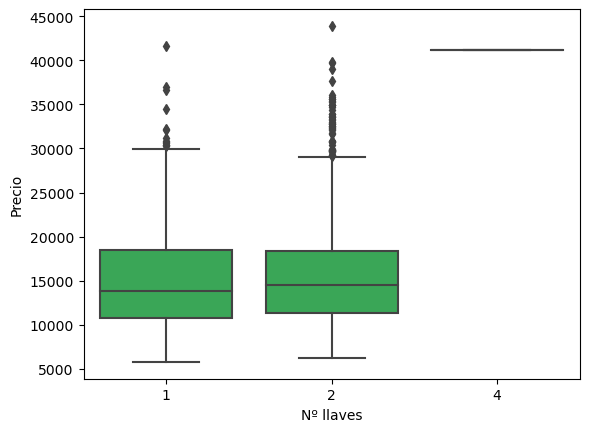

In [75]:
plot = sns.boxplot(x = 'Número de llaves', y = 'Precio', data = datos, color = '#28b84f')
plot.set( xlabel = 'Nº llaves')

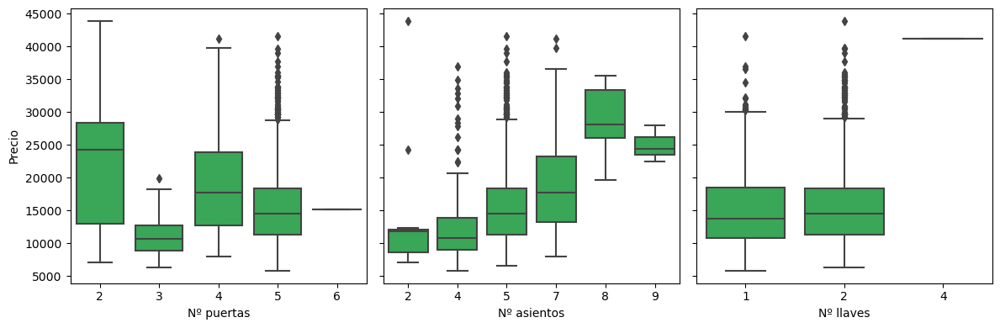

In [76]:
fig, axes = plt.subplots(1, 3, figsize=(12,4))

plot1 = sns.boxplot(x='Puertas', y='Precio', data=datos, color='#28b84f', ax=axes[0])
plot1.set(xlabel='Nº puertas')

plot2 = sns.boxplot(x='Número de asientos', y='Precio', data=datos, color='#28b84f', ax=axes[1])
plot2.set(xlabel='Nº asientos')
plot2.set_ylabel('')
plot2.set_yticklabels([])

plot3 = sns.boxplot(x='Número de llaves', y='Precio', data=datos, color='#28b84f', ax=axes[2])
plot3.set(xlabel='Nº llaves')
plot3.set_ylabel('')
plot3.set_yticklabels([])

plt.tight_layout()
plt.show()

Eliminamos los valores extremos de 4 llaves (el de 2 asientos lo dejamos para más tarde)

In [77]:
datos = datos[~((datos['Número de llaves'] == 4) & (datos['Precio'] > 40000))]
#datos = datos[~((datos['Puertas'] == 2) & (datos['Precio'] > 20000))]

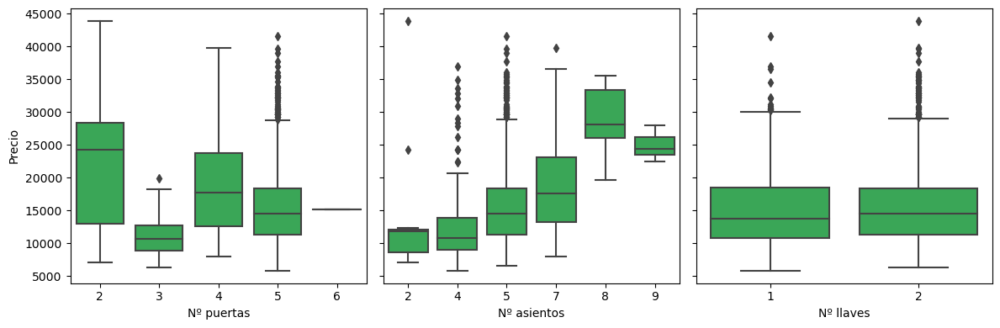

In [78]:
fig, axes = plt.subplots(1, 3, figsize=(12,4))

plot1 = sns.boxplot(x='Puertas', y='Precio', data=datos, color='#28b84f', ax=axes[0])
plot1.set(xlabel='Nº puertas')

plot2 = sns.boxplot(x='Número de asientos', y='Precio', data=datos, color='#28b84f', ax=axes[1])
plot2.set(xlabel='Nº asientos')
plot2.set_ylabel('')
plot2.set_yticklabels([])

plot3 = sns.boxplot(x='Número de llaves', y='Precio', data=datos, color='#28b84f', ax=axes[2])
plot3.set(xlabel='Nº llaves')
plot3.set_ylabel('')
plot3.set_yticklabels([])

plt.tight_layout()
plt.show()

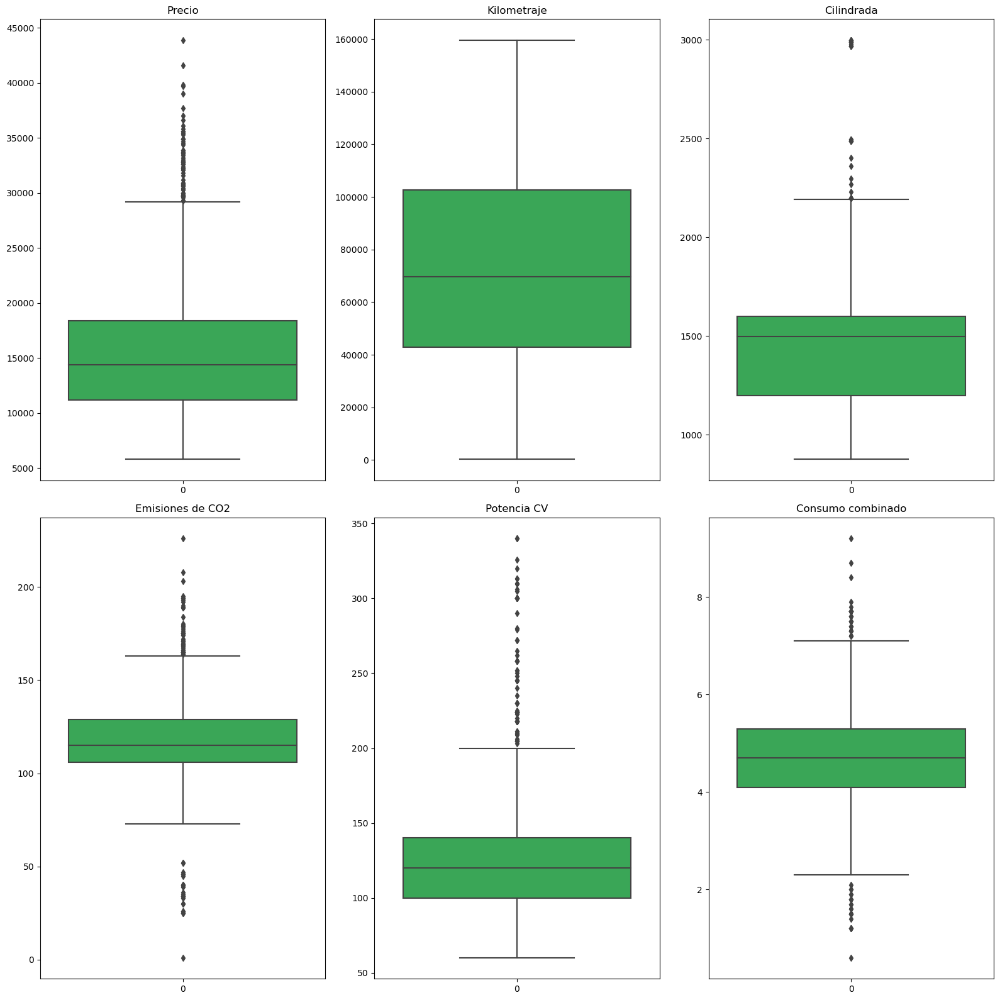

In [79]:
fig, axes = plt.subplots(2, 3, figsize=(16,16))
k = 0
for i in datos.select_dtypes(exclude=['object', 'datetime64', 'int']).columns:
    sns.boxplot(datos[i],ax = axes.flatten()[k], color = '#28b84f').set_title(i)
    k = k+1

plt.tight_layout()
plt.show()

Tenemos algunos valores muy altos y muy bajos pero nada tan extremo

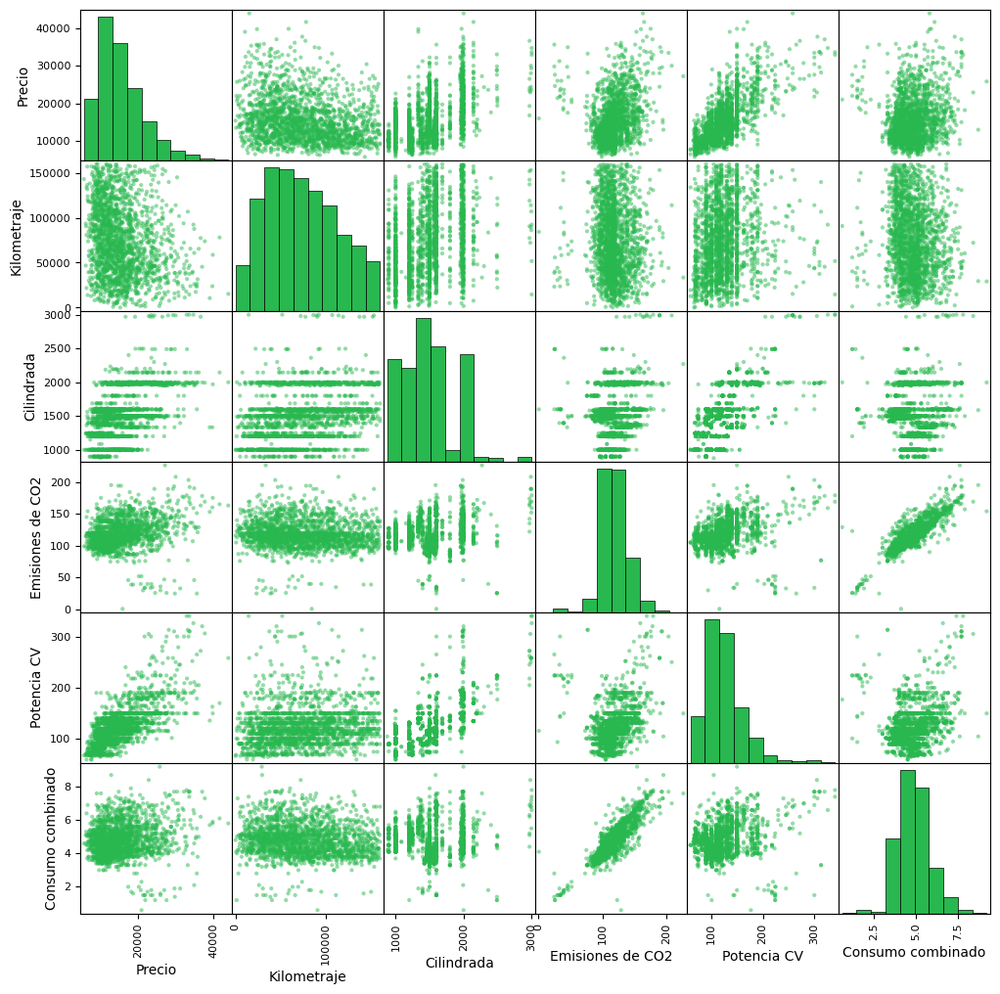

In [80]:
from pandas.plotting import scatter_matrix
import matplotlib.pyplot as plt


# Crear matriz de diagramas de dispersión
scatter_matrix(datos.select_dtypes(exclude=['object','int']), figsize=(12, 12), 
               color='#28b84f') # Esto no cambia el color de las diagonales

# Cambiar color de las barras en los gráficos de la diagonal
for ax in plt.gcf().get_axes():
    if hasattr(ax, 'hist'):
        for _, spine in ax.spines.items():
            spine.set_visible(True)  # Mostrar los bordes del gráfico
        for bar in ax.patches:
            bar.set_facecolor('#28b84f')  # Color de las barras del histograma
            bar.set_edgecolor('black') # Borde de las barras
            bar.set_linewidth(0.5) # Grosor del borden de las barras
            
            

plt.show()

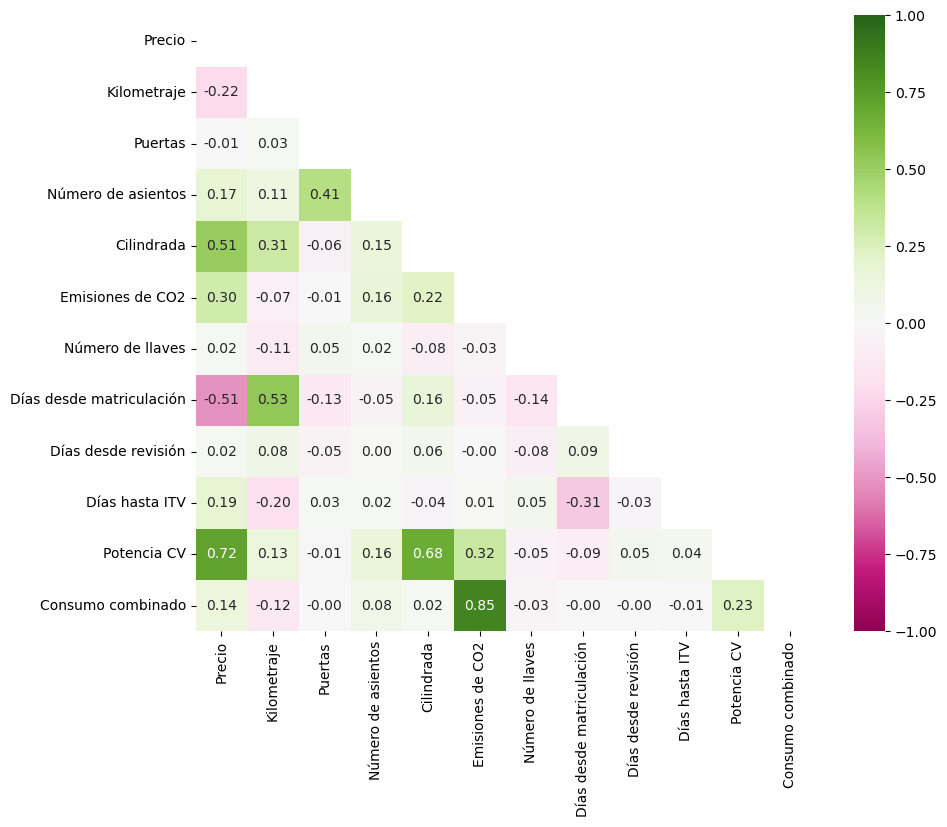

In [81]:
correlacion = datos.select_dtypes(exclude=['object']).corr()
mask = np.zeros_like(correlacion) 

plt.figure(figsize = (10,8))
mask[np.triu_indices_from(mask)] = True
sns.heatmap(correlacion,mask=mask,vmin = -1, vmax=1, center=0, cmap="PiYG",annot=True,fmt=".2f")
plt.show()

In [82]:
correlacion['Precio'].sort_values(ascending=False).head(10)

Precio                 1.000000
Potencia CV            0.719638
Cilindrada             0.513358
Emisiones de CO2       0.295838
Días hasta ITV         0.190800
Número de asientos     0.174940
Consumo combinado      0.141357
Días desde revisión    0.023741
Número de llaves       0.023420
Puertas               -0.008806
Name: Precio, dtype: float64

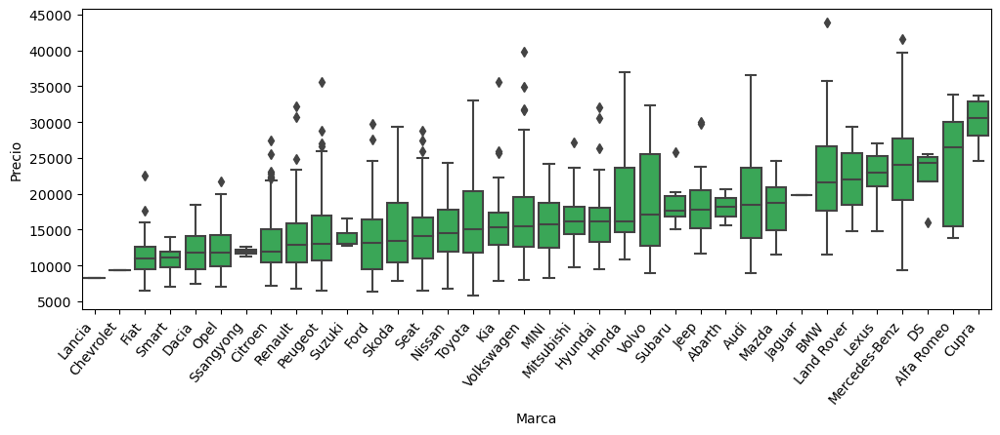

In [83]:
plt.subplots(figsize=(12,4))
mediana_precios_por_marca = datos.groupby('Marca')['Precio'].median().sort_values()
marca_order = mediana_precios_por_marca.index

plot = sns.boxplot(x='Marca', y='Precio', data=datos, color='#28b84f',order=marca_order)
plot.set(xlabel='Marca')
locs, labels = plt.xticks(rotation=50, ha='right')

In [84]:
datos.groupby('Marca').agg(Frecuencia=('Marca', "count")).sort_values('Frecuencia', ascending = False)

,Frecuencia
Marca,
Seat,174
Peugeot,161
Citroen,157
Volkswagen,139
Opel,129
Renault,127
Ford,116
Toyota,95
BMW,84


Eliminamos las marcas que tienen menos de 4 coches

In [85]:
datos = datos[~((datos['Marca'] == 'Chevrolet') | 
                (datos['Marca'] == 'Jaguar') |
                (datos['Marca'] == 'Lancia') |
                (datos['Marca'] == 'Abarth') |
                (datos['Marca'] == 'Ssangyong') |
                (datos['Marca'] == 'Land Rover') )]

In [86]:
datos.groupby('Marca').agg(Frecuencia=('Marca', "count")).sort_values('Frecuencia', ascending = False)

,Frecuencia
Marca,
Seat,174
Peugeot,161
Citroen,157
Volkswagen,139
Opel,129
Renault,127
Ford,116
Toyota,95
BMW,84


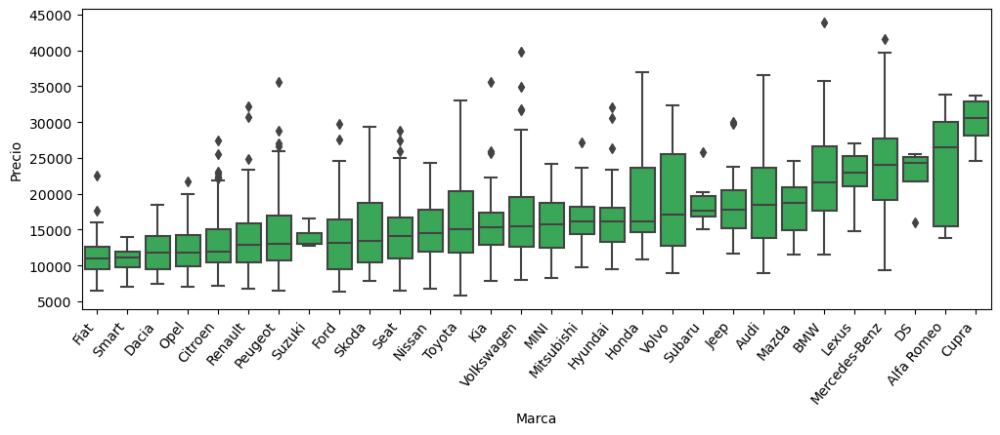

In [87]:
plt.subplots(figsize=(12,4))
mediana_precios_por_marca = datos.groupby('Marca')['Precio'].median().sort_values()
marca_order = mediana_precios_por_marca.index

plot = sns.boxplot(x='Marca', y='Precio', data=datos, color='#28b84f',order=marca_order)
plot.set(xlabel='Marca')
locs, labels = plt.xticks(rotation=50, ha='right')

C:\Users\antdu\AppData\Local\Temp\ipykernel_20352\4052230600.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.subplots(figsize=(12,4))


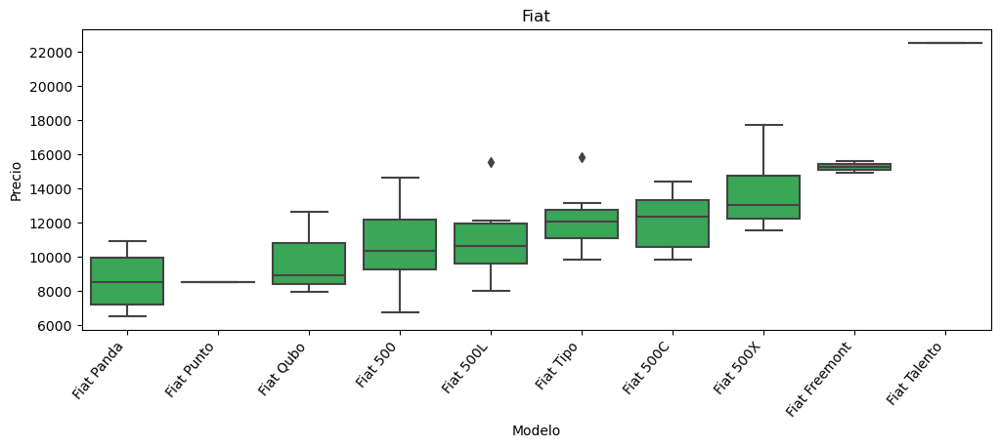

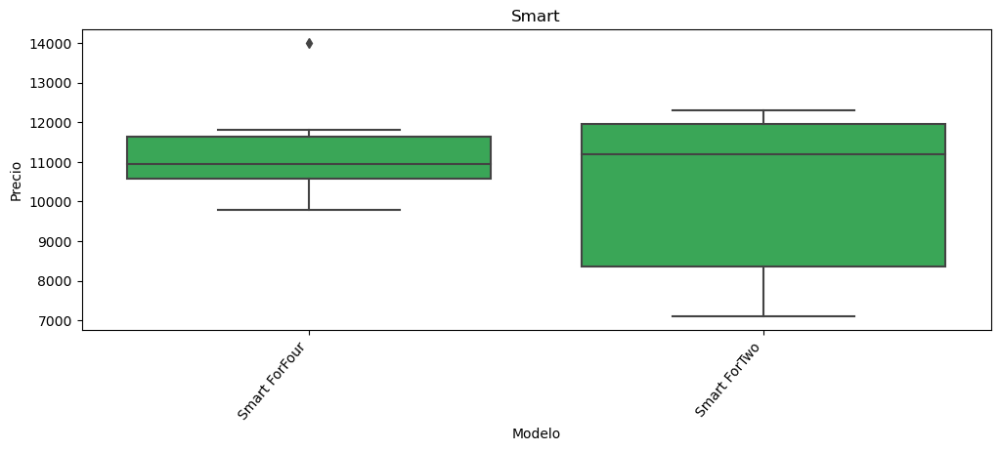

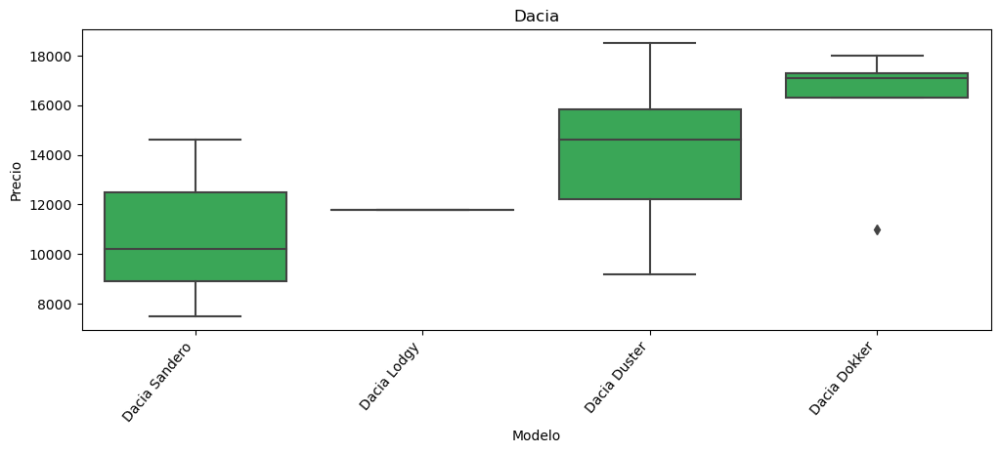

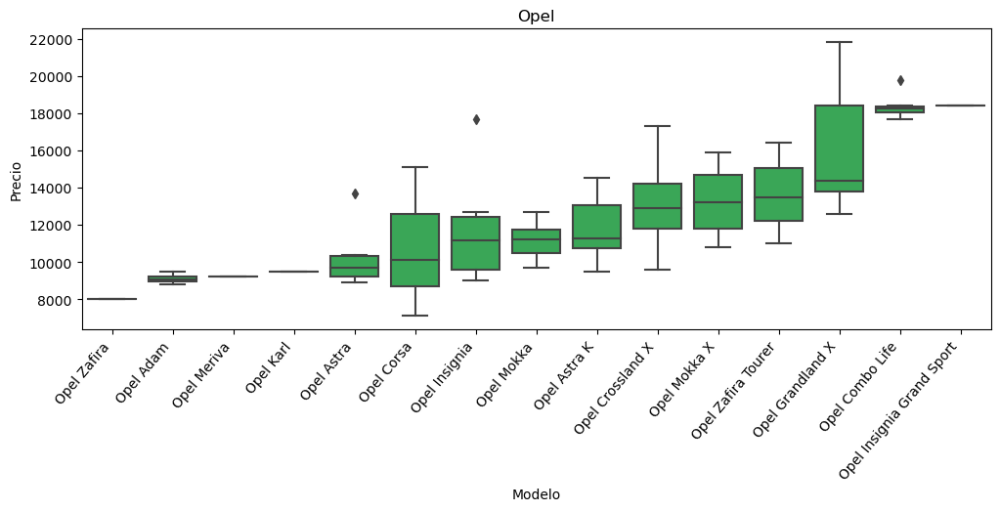

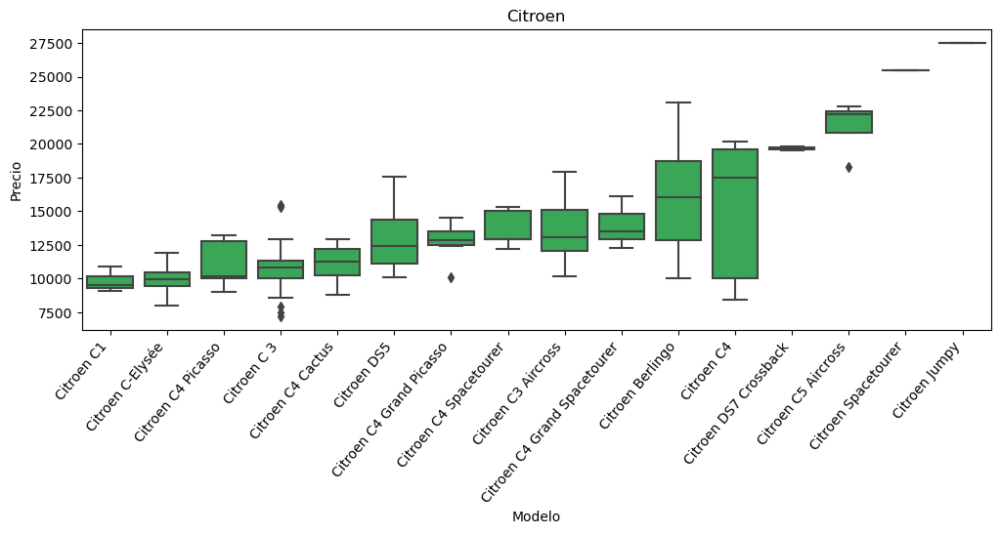

...

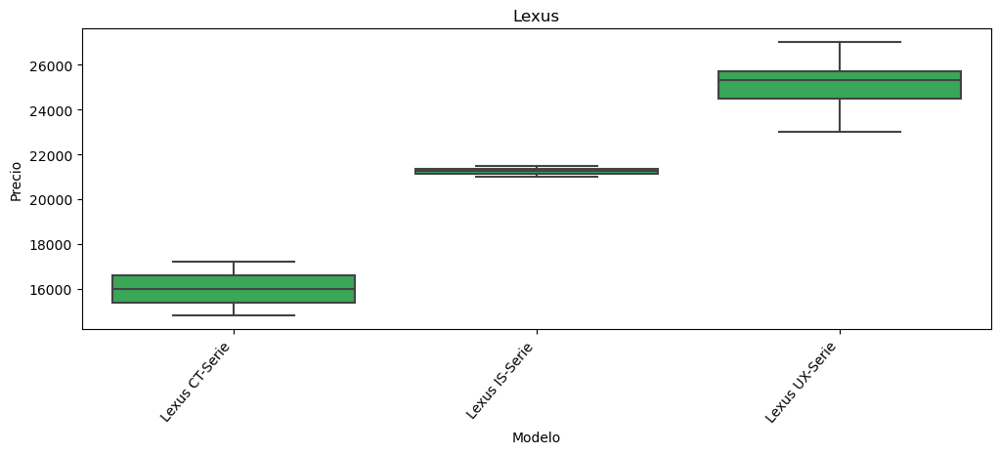

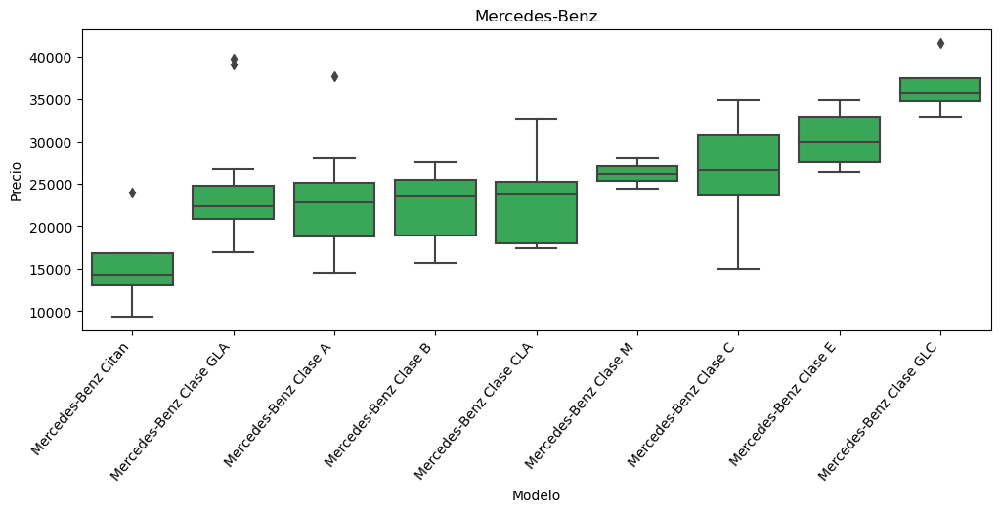

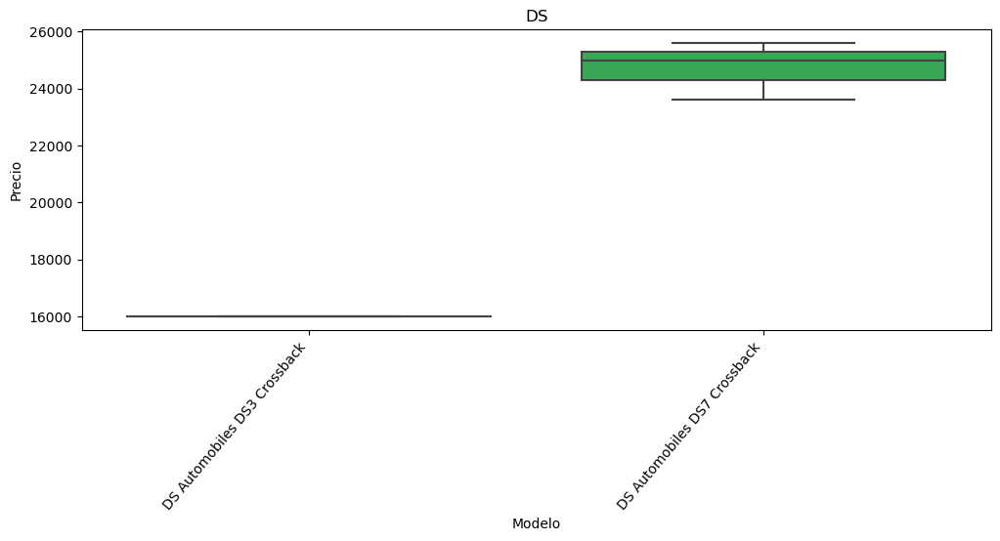

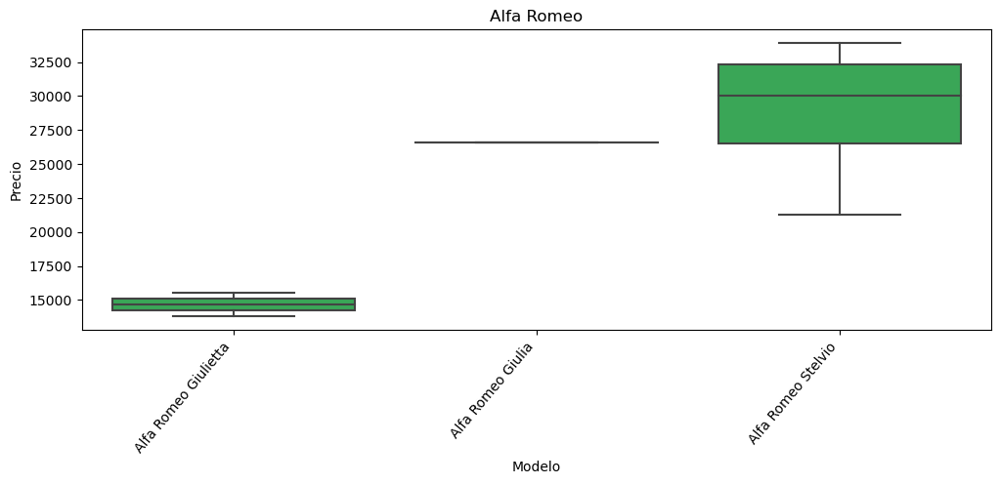

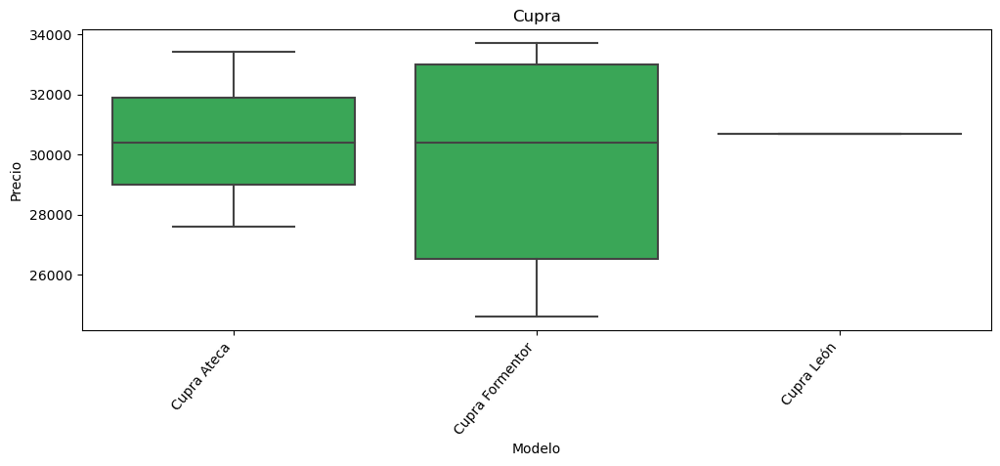

In [88]:
for i in marca_order:
    plt.subplots(figsize=(12,4))
    mediana_precios_por_modelo = datos[datos['Marca'] == i].groupby('Modelo')['Precio'].median().sort_values()
    modelo_order = mediana_precios_por_modelo.index

    plot = sns.boxplot(x='Modelo', y='Precio', data=datos[datos['Marca'] == i], color='#28b84f',order=modelo_order)
    plot.set(xlabel='Modelo')
    locs, labels = plt.xticks(rotation=50, ha='right')
    plot.set_title(i)

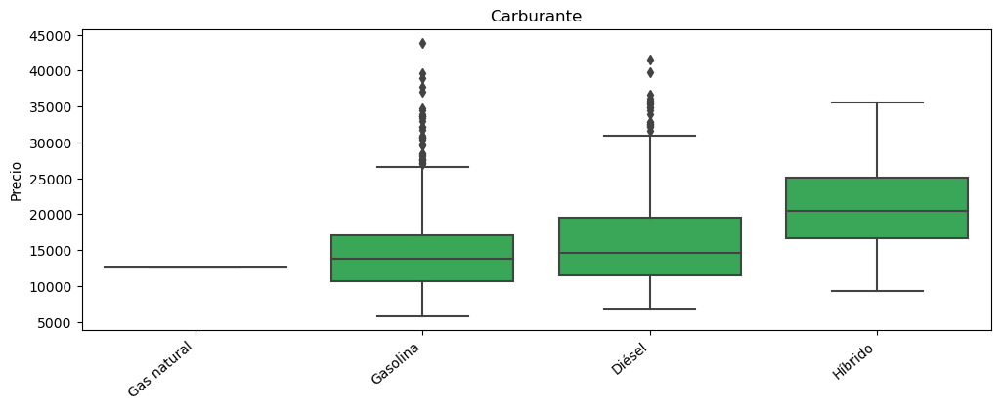

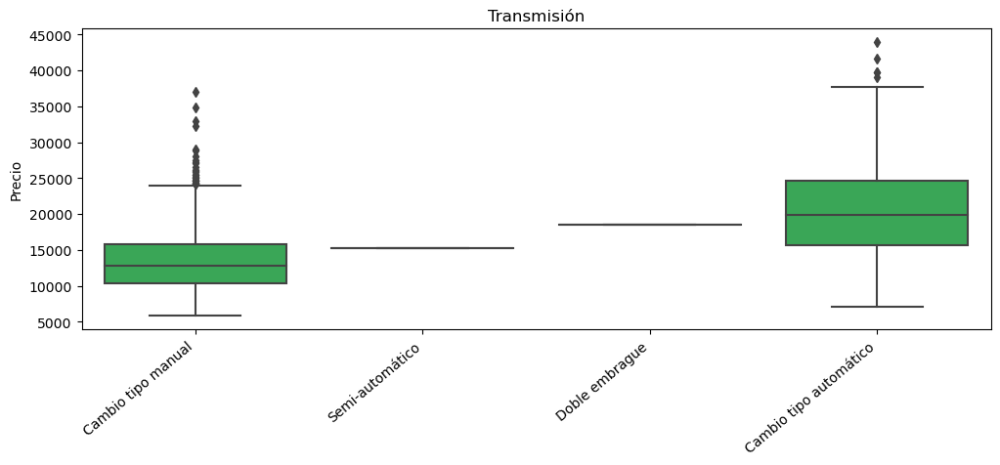

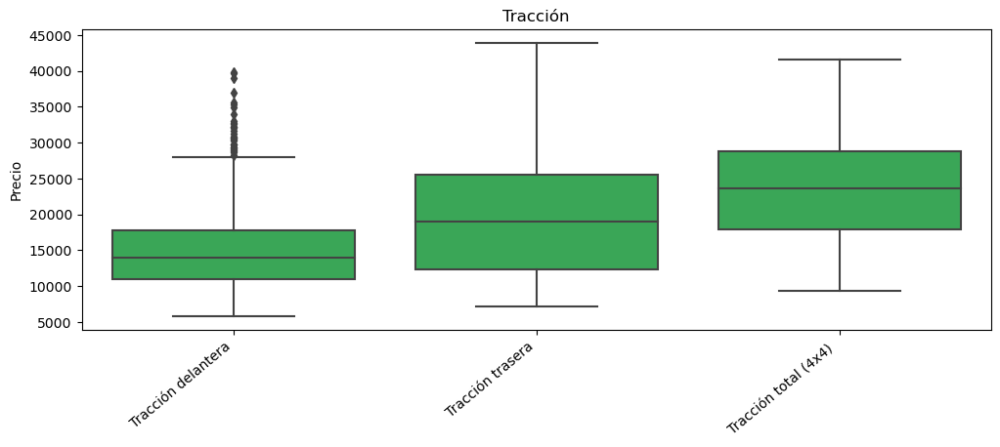

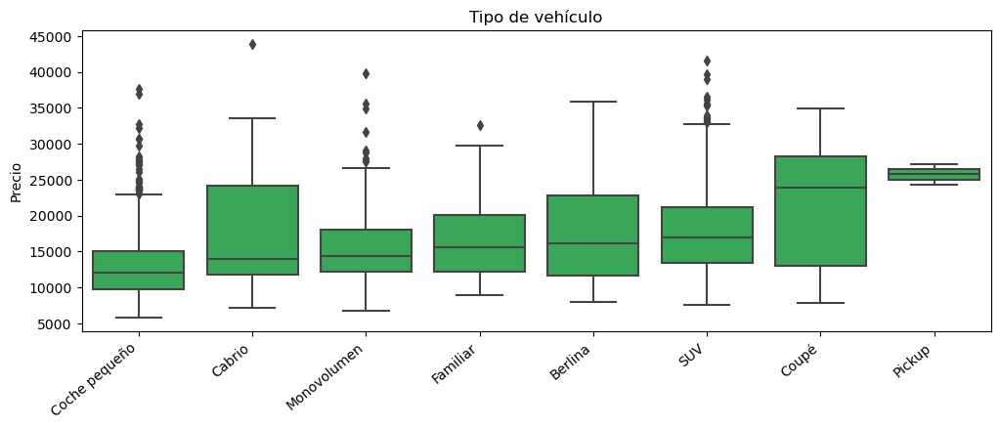

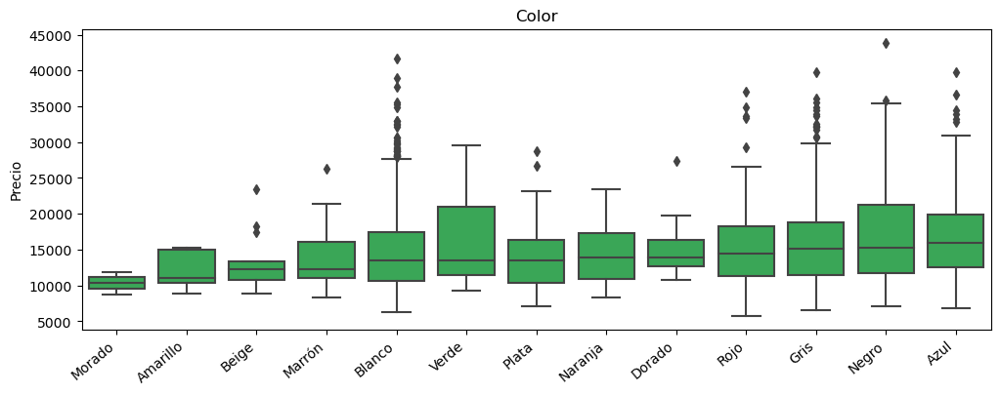

...

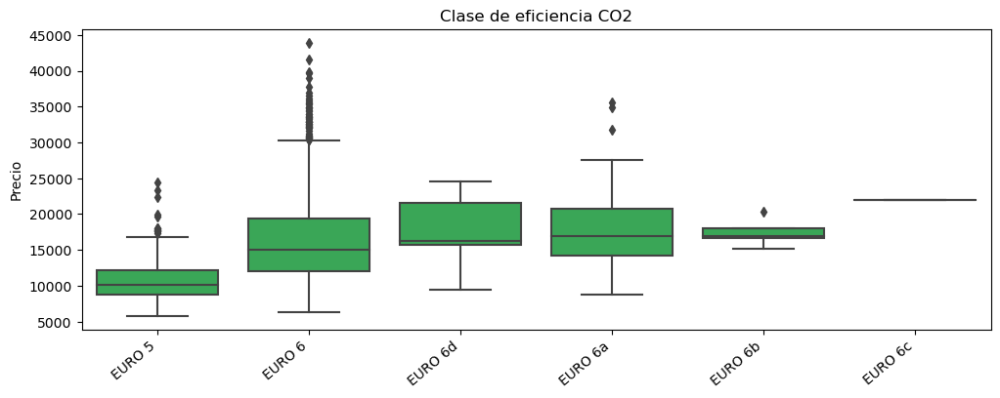

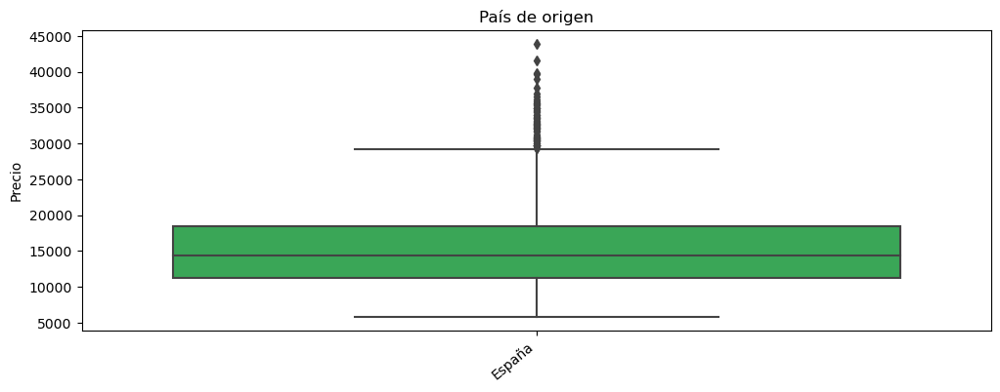

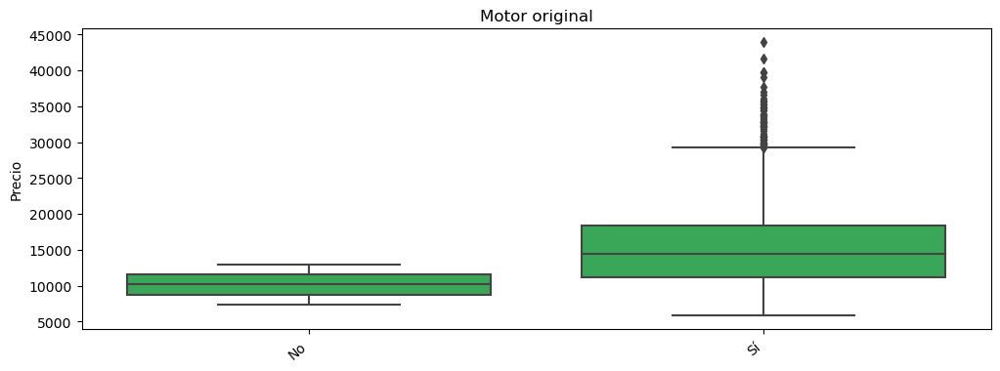

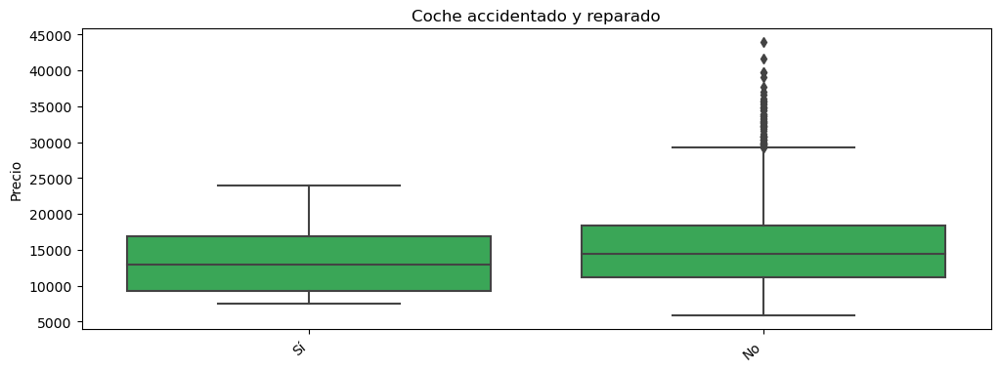

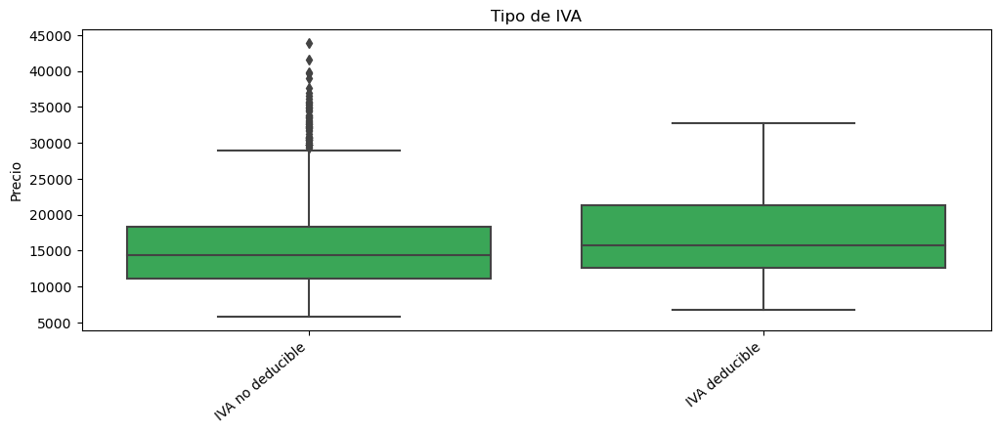

In [89]:
for i in ['Carburante','Transmisión','Tracción','Tipo de vehículo',
          'Color','Tapicería','Tipo de ruedas','Clase de eficiencia CO2',
          'País de origen','Motor original','Coche accidentado y reparado',
         'Tipo de IVA']:

    plt.subplots(figsize=(12,4))
    mediana_precios_por_carac = datos.groupby(i)['Precio'].median().sort_values()
    carac_order = mediana_precios_por_carac.index

    plot = sns.boxplot(x=i, y='Precio', data=datos, color='#28b84f',order=carac_order)
    plot.set(xlabel='')
    plot.set_title(i)
    locs, labels = plt.xticks(rotation=40, ha='right')

Para algunas variables se pueden hacer agrupaciones para reducir los diferentes valores de cada una, por ejemplo, en el tipo de cambio para eliminar el semi- automático y el doble embrague. En la variable tapicería es necesario eliminar el texto entre paréntesis. Eliminamos el pais, ya que solo tiene un valor.

El coche con ruedas de emergencia no tiene sentido y se va a eliminar

Se va a eliminar el coche de gas natural

Se va a eliminar el de tipo Pickup

Se va a eliminar la clase de eficiencia EURO 6c

Todo esto va a hacer que tengamos menos variables dummies, cosa que beneficiará los procesos de búsqueda de los modelos

In [90]:
datos['Tapicería'] = [texto.split('(')[0].strip() for texto in datos['Tapicería']]

#¿el mapeo de transmisión se fustificará en el word con referencia a alguna página que lo explique?
#¿es necesario?
mapeo_transmision = {'Semi-automático': 'Automático', 'Doble embrague': 'Automático',
                    'Cambio tipo manual': 'Manual', 'Cambio tipo automático': 'Automático'}
def transformar_transmision(transmision):
    return mapeo_transmision.get(transmision, transmision)

datos['Transmisión'] = datos['Transmisión'].apply(transformar_transmision)

datos = datos[~((datos['Tipo de ruedas'] == 'Emergencia') | 
                (datos['Tipo de vehículo'] == 'Pickup') |
                (datos['Carburante'] == 'Gas natural') |
                (datos['Clase de eficiencia CO2'] == 'EURO 6c'))]

datos = datos.drop('País de origen', axis=1)

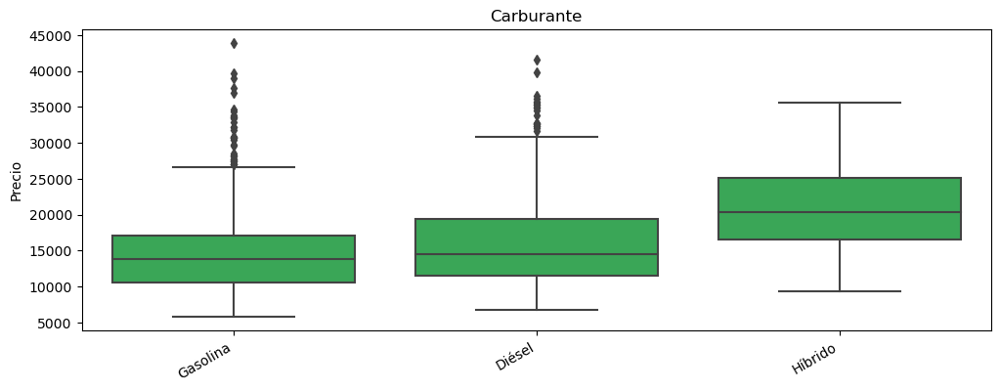

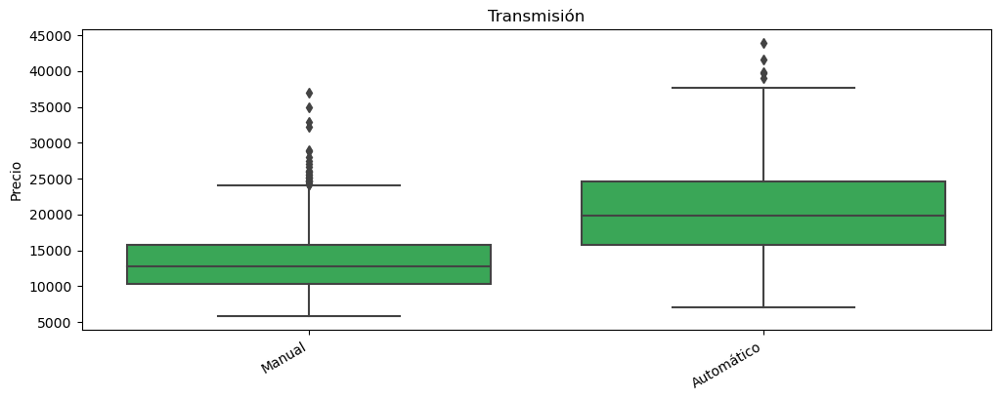

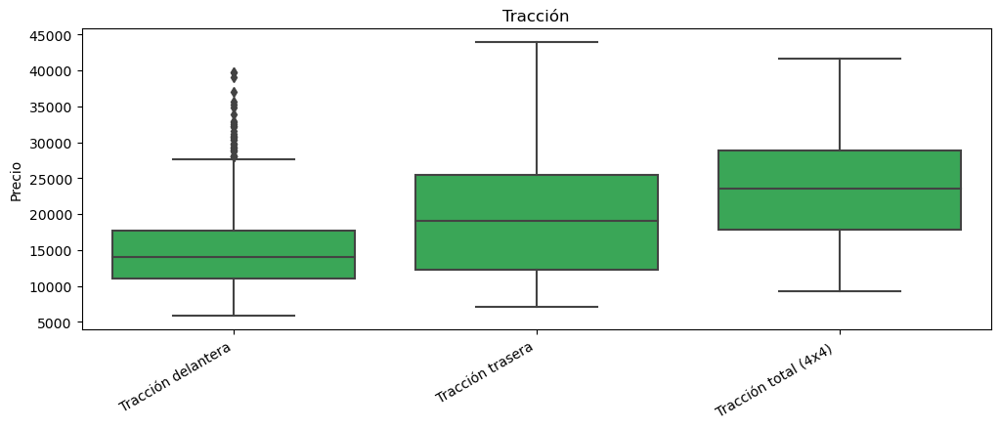

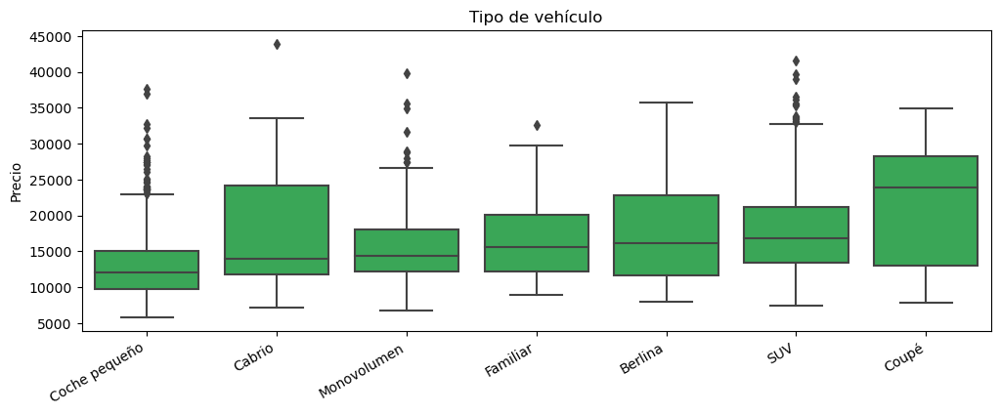

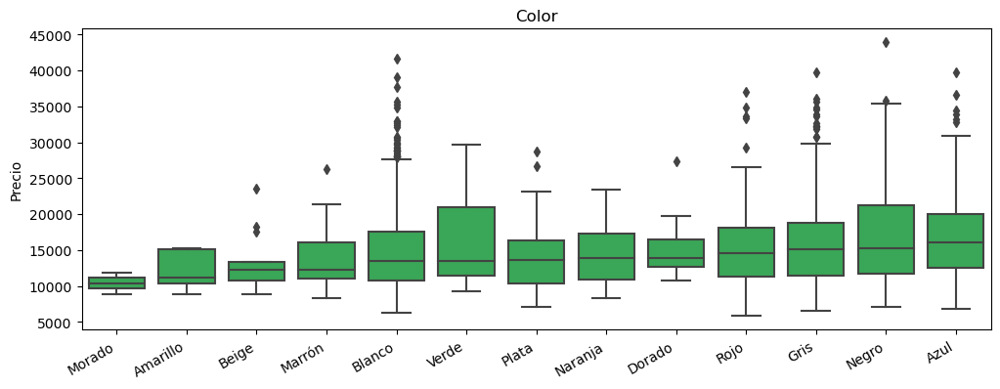

...

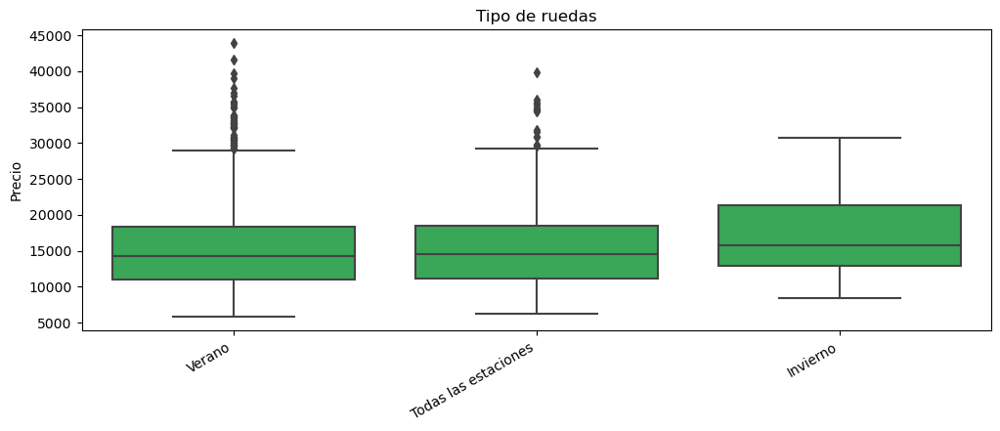

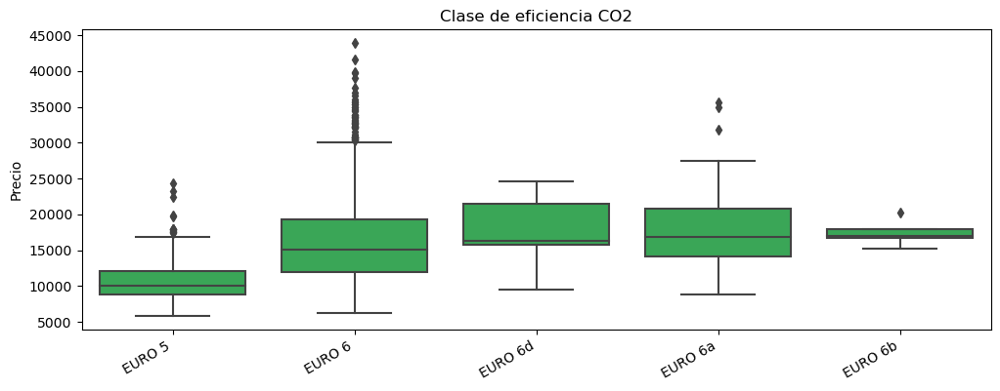

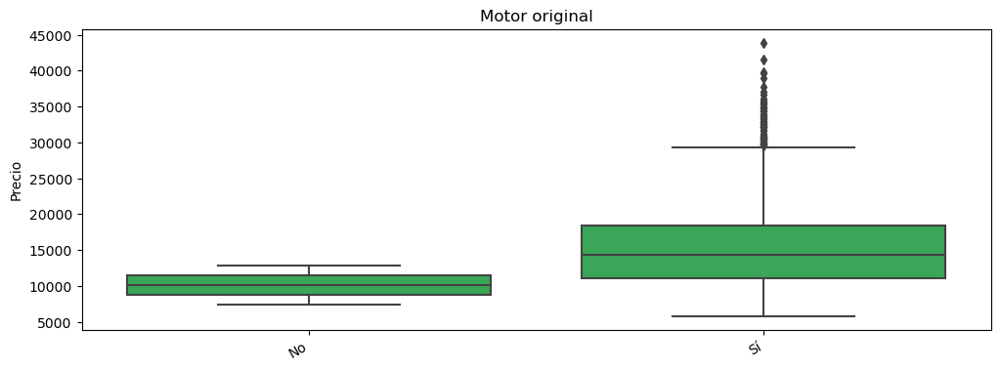

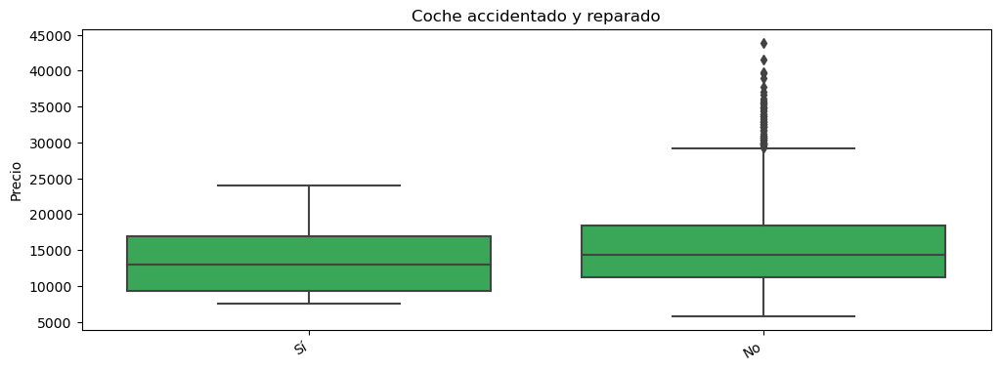

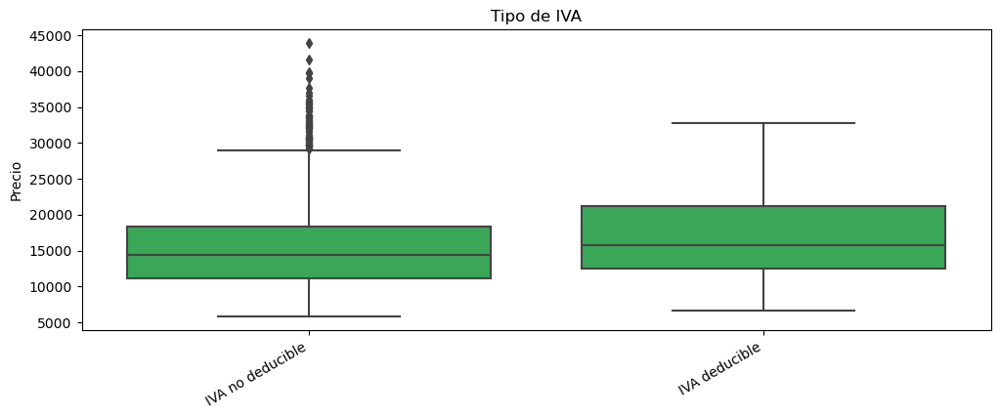

In [91]:
for i in ['Carburante','Transmisión','Tracción','Tipo de vehículo',
          'Color','Tapicería','Tipo de ruedas','Clase de eficiencia CO2',
          'Motor original','Coche accidentado y reparado',
         'Tipo de IVA']:

    plt.subplots(figsize=(12,4))
    mediana_precios_por_carac = datos.groupby(i)['Precio'].median().sort_values()
    carac_order = mediana_precios_por_carac.index

    plot = sns.boxplot(x=i, y='Precio', data=datos, color='#28b84f',order=carac_order)
    plot.set(xlabel='')
    plot.set_title(i)
    locs, labels = plt.xticks(rotation=30, ha='right')

Ahora haremos dummies de las variables categóricas que son interesantes en el estudio y convertimos en 0 y 1 las variables binarias:

* Marca
* Modelo
* Carburante
* Transmisión
* Tracción
* Tipo de vehículo
* Color
* Tapicería
* Tipo de ruedas
* **Motor original**
* Eficiencia
* País de origen
* **Coche accidentado y reparado**
* **Tipo de IVA**



In [92]:
datos

,Marca,Modelo,Precio,Kilometraje,Carburante,Transmisión,Potencia,Tracción,Tipo de vehículo,Puertas,...,Emisiones de CO2,Número de llaves,Coche accidentado y reparado,Tipo de IVA,Matricula,Días desde matriculación,Días desde revisión,Días hasta ITV,Potencia CV,Consumo combinado
0,Opel,Opel Adam,8799.0,17256.0,Gasolina,Manual,87 CV / 64 kW,Tracción delantera,Coche pequeño,3,...,119.0,1,No,IVA no deducible,4901JBK,3477,78,143,87.0,5.0
1,Ford,Ford Puma,19899.0,28670.0,Híbrido,Manual,125 CV / 92 kW,Tracción delantera,SUV,5,...,122.0,2,No,IVA no deducible,5974LYP,720,61,740,125.0,5.6
2,Honda,Honda CR-V,14999.0,130594.0,Gasolina,Automático,155 CV / 114 kW,Tracción total (4x4),SUV,5,...,179.0,2,No,IVA no deducible,9440HRF,4031,431,-14,155.0,7.7
3,Renault,Renault Clio,10499.0,86083.0,Diésel,Manual,90 CV / 66 kW,Tracción delantera,Coche pequeño,5,...,85.0,2,No,IVA no deducible,4931KCD,2504,105,626,90.0,3.5
4,Audi,Audi A3,23699.0,54925.0,Diésel,Automático,150 CV / 110 kW,Tracción delantera,Coche pequeño,5,...,117.0,2,No,IVA no deducible,8901LGX,1447,124,13,150.0,4.0
5,Renault,Renault Clio,8799.0,26382.0,Gasolina,Manual,90 CV / 66 kW,Tracción delantera,Coche pequeño,5,...,105.0,2,No,IVA no deducible,2252JBK,3477,141,186,90.0,4.5
6,Volkswagen,Volkswagen Passat,22599.0,94870.0,Híbrido,Automático,218 CV / 160 kW,Tracción delantera,Familiar,4,...,40.0,2,No,IVA no deducible,0894KJK,2269,48,653,218.0,1.7
7,Jeep,Jeep Grand Cherokee,29999.0,113817.0,Diésel,Automático,250 CV / 184 kW,Tracción total (4x4),SUV,5,...,208.0,1,No,IVA no deducible,0262KWF,1883,61,352,250.0,7.0
8,Citroen,Citroen Berlingo,12199.0,72735.0,Diésel,Manual,99 CV / 73 kW,Tracción delantera,Monovolumen,5,...,113.0,2,No,IVA no deducible,4398KBZ,2508,147,413,99.0,4.3
9,Opel,Opel Mokka,9699.0,140444.0,Diésel,Manual,130 CV / 96 kW,Tracción delantera,SUV,5,...,120.0,2,No,IVA no deducible,5988JCV,3388,103,280,130.0,4.7


In [93]:
#Binarias
datos['Motor original'] = datos['Motor original'].map({'Sí': 1, 'No': 0})
datos['Coche accidentado y reparado'] = datos['Coche accidentado y reparado'].map({'Sí': 1, 'No': 0})
datos['Tipo de IVA'] = datos['Tipo de IVA'].map({'IVA no deducible': 0, 'IVA deducible': 1})

In [94]:
#Categóricas
datos = pd.get_dummies(datos, columns=['Marca','Modelo',
                                         'Carburante','Transmisión','Tracción','Tipo de vehículo',
                                         'Color','Tapicería','Tipo de ruedas','Clase de eficiencia CO2'],dtype=int,drop_first=True)

In [41]:
datos

,Precio,Kilometraje,Potencia,Puertas,Número de asientos,Motor original,Cilindrada,Consumo,Emisiones de CO2,Número de llaves,...,Color_Verde,Tapicería_Cuero,Tapicería_Cuero parcial,Tapicería_Tejido,Tipo de ruedas_Todas las estaciones,Tipo de ruedas_Verano,Clase de eficiencia CO2_EURO 6,Clase de eficiencia CO2_EURO 6a,Clase de eficiencia CO2_EURO 6b,Clase de eficiencia CO2_EURO 6d
0,8799.0,17256.0,87 CV / 64 kW,3,4,1,1398.0,6.6 l/100 km (En la ciudad)5 l/100 km (Combina...,119.0,1,...,0,0,0,1,0,1,0,0,0,0
1,19899.0,28670.0,125 CV / 92 kW,5,5,1,999.0,5.6 l/100 km (Combinado),122.0,2,...,0,0,0,1,1,0,1,0,0,0
2,14999.0,130594.0,155 CV / 114 kW,5,5,1,1997.0,10.1 l/100 km (En la ciudad)7.7 l/100 km (Comb...,179.0,2,...,0,1,0,0,1,0,0,0,0,0
3,10499.0,86083.0,90 CV / 66 kW,5,5,1,1461.0,4 l/100 km (En la ciudad)3.5 l/100 km (Combina...,85.0,2,...,0,0,0,1,0,1,1,0,0,0
4,23699.0,54925.0,150 CV / 110 kW,5,5,1,1968.0,4.9 l/100 km (En la ciudad)4 l/100 km (Combina...,117.0,2,...,0,0,1,0,1,0,1,0,0,0
5,8799.0,26382.0,90 CV / 66 kW,5,5,1,898.0,5.6 l/100 km (En la ciudad)4.5 l/100 km (Combi...,105.0,2,...,0,0,0,1,0,1,0,0,0,0
6,22599.0,94870.0,218 CV / 160 kW,4,5,1,1395.0,1.7 l/100 km (Combinado),40.0,2,...,0,0,1,0,0,1,1,0,0,0
7,29999.0,113817.0,250 CV / 184 kW,5,5,1,2987.0,8 l/100 km (En la ciudad)7 l/100 km (Combinado...,208.0,1,...,0,0,1,0,0,1,1,0,0,0
8,12199.0,72735.0,99 CV / 73 kW,5,5,1,1560.0,5.1 l/100 km (En la ciudad)4.3 l/100 km (Combi...,113.0,2,...,0,0,0,1,0,1,1,0,0,0
9,9699.0,140444.0,130 CV / 96 kW,5,5,1,1686.0,5.8 l/100 km (En la ciudad)4.7 l/100 km (Combi...,120.0,2,...,0,0,0,1,0,1,0,0,0,0


In [95]:
datos = datos.select_dtypes(exclude=['object'])

In [96]:
datos.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1908 entries, 0 to 1923
Columns: 328 entries, Precio to Clase de eficiencia CO2_EURO 6d
dtypes: float64(6), int32(314), int64(8)
memory usage: 2.5 MB


Lo que más columnas mete al crear dummies es el modelo. ¿Es lo suficientemente importante como para dejarlo?

In [44]:
datos.isnull().sum()

Precio                                  0
Kilometraje                             0
Puertas                                 0
Número de asientos                      0
Motor original                          0
Cilindrada                              0
Emisiones de CO2                        0
Número de llaves                        0
Coche accidentado y reparado            0
Tipo de IVA                             0
Días desde matriculación                0
Días desde revisión                     0
Días hasta ITV                          0
Potencia CV                             0
Consumo combinado                       0
Marca_Audi                              0
Marca_BMW                               0
Marca_Citroen                           0
Marca_Cupra                             0
Marca_DS                                0
Marca_Dacia                             0
Marca_Fiat                              0
Marca_Ford                              0
Marca_Honda                       

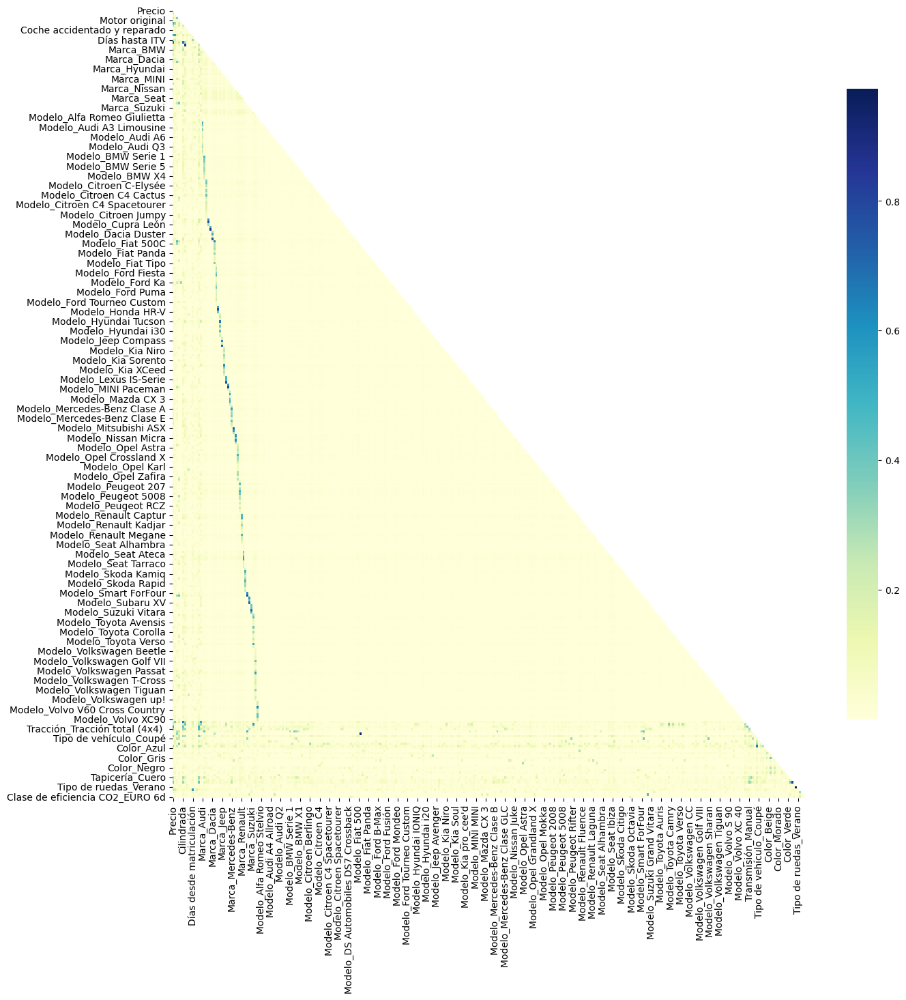

In [45]:
correlacion = np.abs(datos.corr())
mask = np.zeros_like(correlacion) 

mask[np.triu_indices_from(mask)] = True
plt.subplots(figsize=(15,15))
sns.heatmap(correlacion,mask=mask, cmap="YlGnBu", cbar_kws={"shrink": .8})
plt.show()

In [46]:
pd.DataFrame(correlacion['Precio'].sort_values(ascending=False).head(20))

,Precio
Precio,1.000000
Potencia CV,0.709558
Transmisión_Manual,0.547465
Días desde matriculación,0.518473
Cilindrada,0.496501
Tapicería_Tejido,0.374855
Tipo de vehículo_Coche pequeño,0.354908
Tracción_Tracción total (4x4),0.324061
Tipo de vehículo_SUV,0.311011
Emisiones de CO2,0.282683


Viendo que no hay ningún color ni modelo que tengan una gran correlación con el precio, vamos a optar por quitarlos y facilitar así los modelos. Cuantas menos características, menos dummies y la búsqueda será más rápida

In [97]:
columnas = datos.filter(regex='^(Color_|Modelo_)').columns

# Eliminar las columnas seleccionadas
datos = datos.drop(columns=columnas)

In [98]:
datos.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1908 entries, 0 to 1923
Data columns (total 64 columns):
 #   Column                               Non-Null Count  Dtype  
---  ------                               --------------  -----  
 0   Precio                               1908 non-null   float64
 1   Kilometraje                          1908 non-null   float64
 2   Puertas                              1908 non-null   int32  
 3   Número de asientos                   1908 non-null   int64  
 4   Motor original                       1908 non-null   int64  
 5   Cilindrada                           1908 non-null   float64
 6   Emisiones de CO2                     1908 non-null   float64
 7   Número de llaves                     1908 non-null   int64  
 8   Coche accidentado y reparado         1908 non-null   int64  
 9   Tipo de IVA                          1908 non-null   int64  
 10  Días desde matriculación             1908 non-null   int64  
 11  Días desde revisión                

Pasamos a tener 64 columnas y va a ser más fácil trabajar

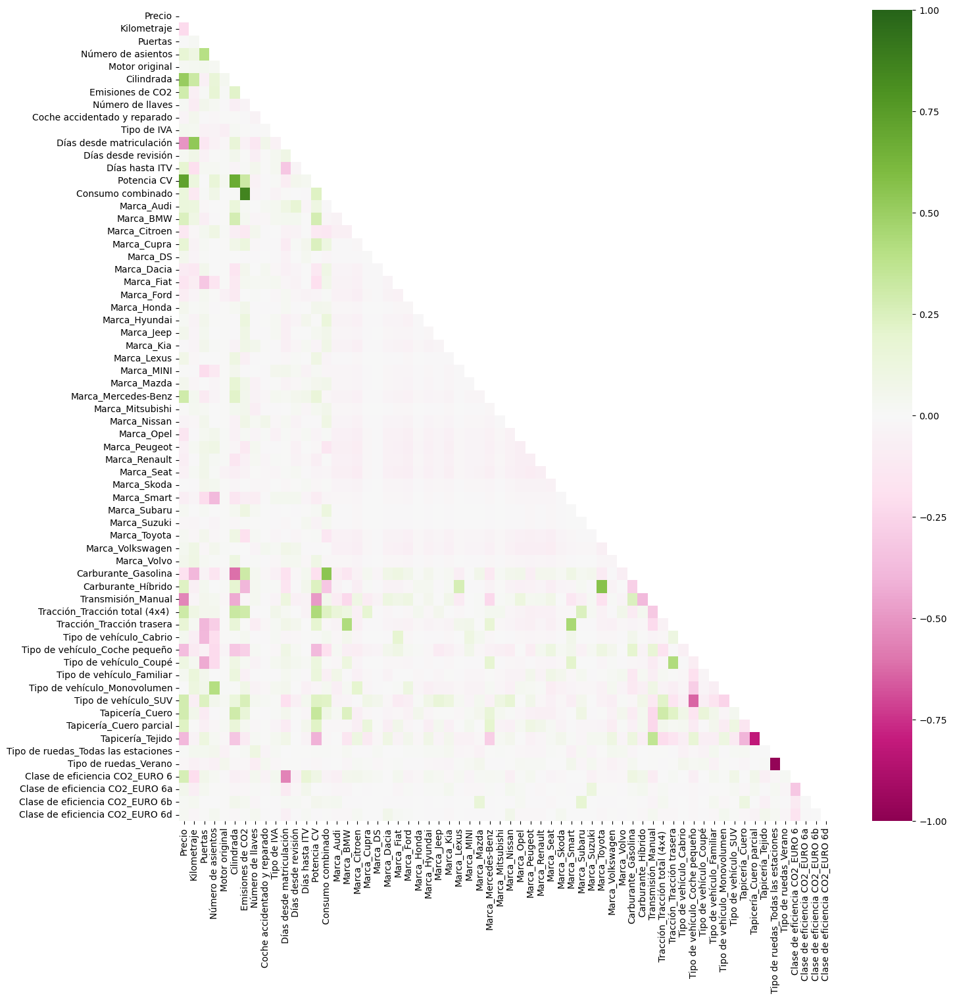

In [100]:
correlacion = datos.corr()
mask = np.zeros_like(correlacion) 

plt.figure(figsize = (16,16))
mask[np.triu_indices_from(mask)] = True
sns.heatmap(correlacion,mask=mask,vmin = -1, vmax=1, center=0, cmap="PiYG")
plt.show()

**¿Incluyo el gráfico anterior en el word o es demasiado? Puede que solo interese la tabla con la correlación con el precio**

In [101]:
pd.DataFrame(correlacion['Precio'].sort_values(ascending=False).head(20))

,Precio
Precio,1.000000
Potencia CV,0.719846
Cilindrada,0.511220
Tracción_Tracción total (4x4),0.311520
Marca_Mercedes-Benz,0.299575
Emisiones de CO2,0.291738
Tipo de vehículo_SUV,0.288085
Tapicería_Cuero,0.282046
Clase de eficiencia CO2_EURO 6,0.271396
Marca_BMW,0.243998


In [102]:
datos.describe().T #Este no se va a incluir

,count,mean,std,min,25%,50%,75%,max
Precio,1908.0,15599.157233,5937.055338,5799.0,11099.00,14399.0,18399.00,43899.0
Kilometraje,1908.0,74030.338050,38794.245598,202.0,42905.75,69700.5,102752.25,159645.0
Puertas,1908.0,4.815514,0.574343,2.0,5.00,5.0,5.00,6.0
Número de asientos,1908.0,5.009958,0.574228,2.0,5.00,5.0,5.00,9.0
Motor original,1908.0,0.998952,0.032368,0.0,1.00,1.0,1.00,1.0
Cilindrada,1908.0,1484.602725,370.078722,875.0,1199.00,1498.0,1598.00,2998.0
Emisiones de CO2,1908.0,117.781971,21.373588,1.0,106.00,115.0,129.00,208.0
Número de llaves,1908.0,1.822851,0.381895,1.0,2.00,2.0,2.00,2.0
Coche accidentado y reparado,1908.0,0.011530,0.106787,0.0,0.00,0.0,0.00,1.0
Tipo de IVA,1908.0,0.033019,0.178733,0.0,0.00,0.0,0.00,1.0


Veamos la influencia de variables

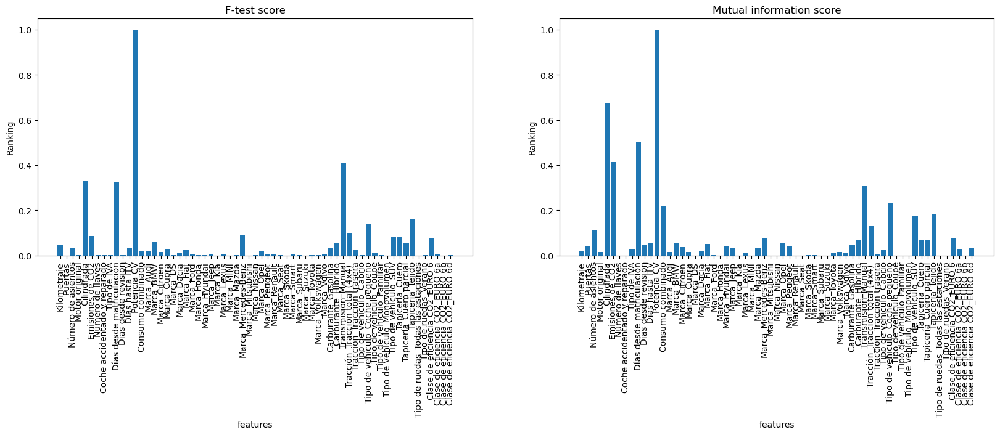

In [103]:
X=datos.drop(['Precio'],axis=1)
y=datos['Precio']

f_test, _ = f_regression(X, y) 
f_test /= np.max(f_test) 
mi = mutual_info_regression(X, y) 
mi /= np.max(mi)

feature_names = X.columns

plt.figure(figsize=(20, 5)) 
plt.subplot(1,2,1) 
plt.bar(range(X.shape[1]), f_test, align="center") 
plt.xticks(range(X.shape[1]), feature_names, rotation = 90) 
plt.xlabel('features')
plt.ylabel('Ranking') 
plt.title('F-test score') 
plt.subplot(1,2,2) 
plt.bar(range(X.shape[1]), mi, align="center") 
plt.xticks(range(X.shape[1]), feature_names, rotation = 90) 
plt.xlabel('features') 
plt.ylabel('Ranking') 
plt.title('Mutual information score') 
plt.show()

podemos intentar seleccionar variables que tengan una puntuación alta en estos gráficos pero quizá nos queden pocas variables (solo la potencia pasa del 0.8)

# Modelos

En primer lugar separaremos la muestra en entrenamiento (70%) y test (30%)

In [104]:


X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=0.3,random_state=0)

## Regresión lineal

In [105]:
lm = LinearRegression()
lm.fit(X_train, y_train)
y_pred = lm.predict(X_test)
mse_test = np.mean((y_test-y_pred)**2)
print('El ECM es {:.3f}'.format(mse_test))
score = lm.score(X_test, y_test)
print('El R^2 es {:.3f}'.format(score))

El ECM es 3975171.542
El R^2 es 0.879


Este modelo es bueno con buen $R^2$

In [106]:
# Probamos a quitar los coches caros de 2 puertas
datos = datos[~((datos['Puertas'] == 2) & (datos['Precio'] > 20000))]
X=datos.drop(['Precio'],axis=1)
y=datos['Precio']
X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=0.3,random_state=0)
lm = LinearRegression()
lm.fit(X_train, y_train)
y_pred = lm.predict(X_test)
mse_test = np.mean((y_test-y_pred)**2)
print('El ECM es {:.3f}'.format(mse_test))
score = lm.score(X_test, y_test)
print('El R^2 es {:.3f}'.format(score))

El ECM es 3723021.509
El R^2 es 0.894


Nos quedamos mejor con el modelo sin los coches de 2 puertas que eran más caros

## Ridge regression

Intentamos optimizar el valor de $\alpha$ que penaliza el error de estimación cometido

best mean cross-validation score: 0.867
best parameters: {'alpha': 2.0092330025650473}


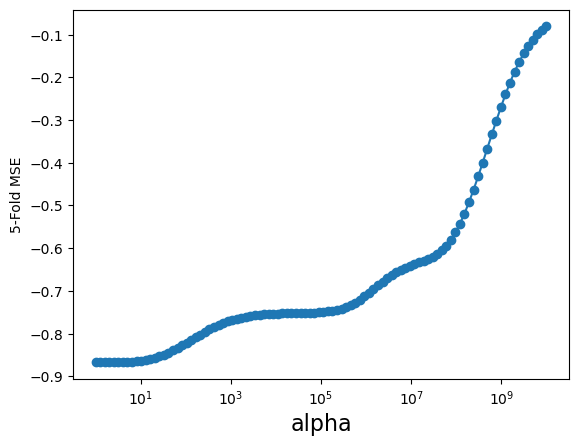

In [181]:
alpha_vector = np.logspace(0, 10, 100) 
param_grid = {'alpha': alpha_vector } 
grid = GridSearchCV(Ridge(random_state=0), param_grid=param_grid, cv=5) 
grid.fit(X_train, y_train)
print("best mean cross-validation score: {:.3f}".format(grid.best_score_))
print("best parameters: {}".format(grid.best_params_)) 
scores = -1*np.array(grid.cv_results_['mean_test_score']) 
plt.semilogx(alpha_vector, scores, '-o') 
plt.xlabel('alpha', fontsize=16) 
plt.ylabel('5-Fold MSE') 
plt.show()

In [182]:
alpha_optimo = grid.best_params_['alpha'] 
ridge = Ridge(random_state=0,**grid.best_params_).fit(X_train, y_train) 


y_pred = ridge.predict(X_test)
mse_test = np.mean((y_test-y_pred)**2)
print('El ECM es {:.3f}'.format(mse_test))
score = ridge.score(X_test, y_test)
print('El R^2 es {:.4f}'.format(score))

El ECM es 3669318.229
El R^2 es 0.8951


Modelo con un $R^2$ bastante bueno

# Regresión lasso

best mean cross-validation score: 0.867
best parameters: {'alpha': 1.5922827933410924}


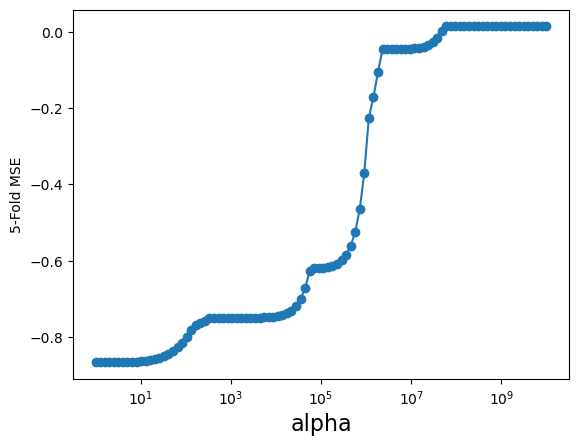

In [179]:
alpha_vector = np.logspace(0, 10, 100) 
param_grid = {'alpha': alpha_vector } 
grid = GridSearchCV(Lasso(max_iter=100000,random_state=0), param_grid=param_grid, cv=5) 
grid.fit(X_train, y_train)
print("best mean cross-validation score: {:.3f}".format(grid.best_score_))
print("best parameters: {}".format(grid.best_params_)) 
scores = -1*np.array(grid.cv_results_['mean_test_score']) 
plt.semilogx(alpha_vector, scores, '-o') 
plt.xlabel('alpha', fontsize=16) 
plt.ylabel('5-Fold MSE') 
plt.show()

In [180]:
alpha_optimo = grid.best_params_['alpha'] 
lasso = Lasso(random_state=0,**grid.best_params_).fit(X_train, y_train) 


y_pred = lasso.predict(X_test)
mse_test = np.mean((y_test-y_pred)**2)
print('El ECM es {:.3f}'.format(mse_test))
score = lasso.score(X_test, y_test)
print('El R^2 es {:.4f}'.format(score))

El ECM es 3648642.443
El R^2 es 0.8957


# Árbol de decisión


In [183]:
# SELECCIÓN DEL MODELO (model selection) 
max_depth = np.arange(2, 30, 1)
min_samples_leaf = np.arange(2, 30, 1)
# rejilla de valores posibles que queremos explorar 
param_grid = {'max_depth': max_depth, 'min_samples_leaf': min_samples_leaf}
# Validaremos el modelo mediante validación cruzada en n_folds 
n_folds = 5
grid = GridSearchCV(DecisionTreeRegressor(random_state=0), 
                    param_grid=param_grid, cv=5, return_train_score=True) 
grid.fit(X_train, y_train)
print("best mean cross-validation score: {:.3f}".format(grid.best_score_))
print("best parameters: {}".format(grid.best_params_))

best mean cross-validation score: 0.738
best parameters: {'max_depth': 10, 'min_samples_leaf': 18}


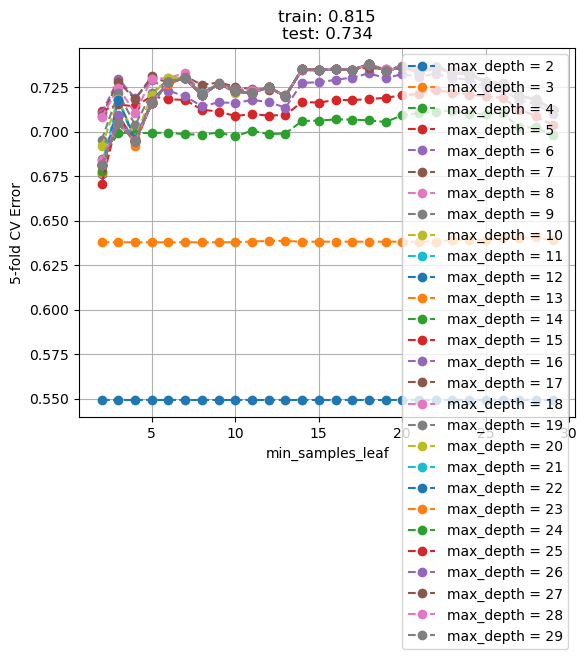

In [184]:
arbol1 = DecisionTreeRegressor(random_state=0,**grid.best_params_).fit(X_train, y_train) 
error = grid.cv_results_['mean_test_score'].reshape(len(max_depth),len(min_samples_leaf)) 
for i, lr in enumerate(list(max_depth)): 
    plt.plot(min_samples_leaf, error[i,],'--o', label='max_depth = %g'%lr) 
plt.legend() 
plt.xlabel('min_samples_leaf') 
plt.ylabel('{}-fold CV Error'.format(n_folds)) 
plt.title('train: %0.3f\ntest: %0.3f'%(arbol1.score(X_train, y_train), arbol1.score(X_test, y_test))) 
plt.grid() 
plt.show()

## Random forest

In [54]:
start = timeit.default_timer()
# SELECCIÓN DEL MODELO (model selection) 
max_depth = np.arange(25, 70, 1)
#min_samples_leaf = np.arange(2, 30, 1) SALE 2
n_estimators = [250,275,300,350,375,400]
#Tarda bastante
# rejilla de valores posibles que queremos explorar 
# param_grid = {'max_depth': max_depth, 'min_samples_leaf': min_samples_leaf, 'n_estimators': n_estimators}
param_grid = {'max_depth': max_depth, 'n_estimators': n_estimators}
# Validaremos el modelo mediante validación cruzada en n_folds (este tarda bastante)
n_folds = 5 
grid = GridSearchCV(RandomForestRegressor(random_state=0),
                    param_grid=param_grid, cv=5, return_train_score=True) 
grid.fit(X_train, y_train) 
print("best mean cross-validation score: {:.4f}".format(grid.best_score_)) 
print("best parameters: {}".format(grid.best_params_)) 

stop = timeit.default_timer()
print('Time: ', stop - start) 

best mean cross-validation score: 0.8323
best parameters: {'max_depth': 25, 'n_estimators': 400}
Time:  7074.2864482


Se podría intentar mejorar este modelo buscando otros parámetros

In [186]:
arbol2 = RandomForestRegressor(random_state=0, **grid.best_params_).fit(X_train, y_train) 

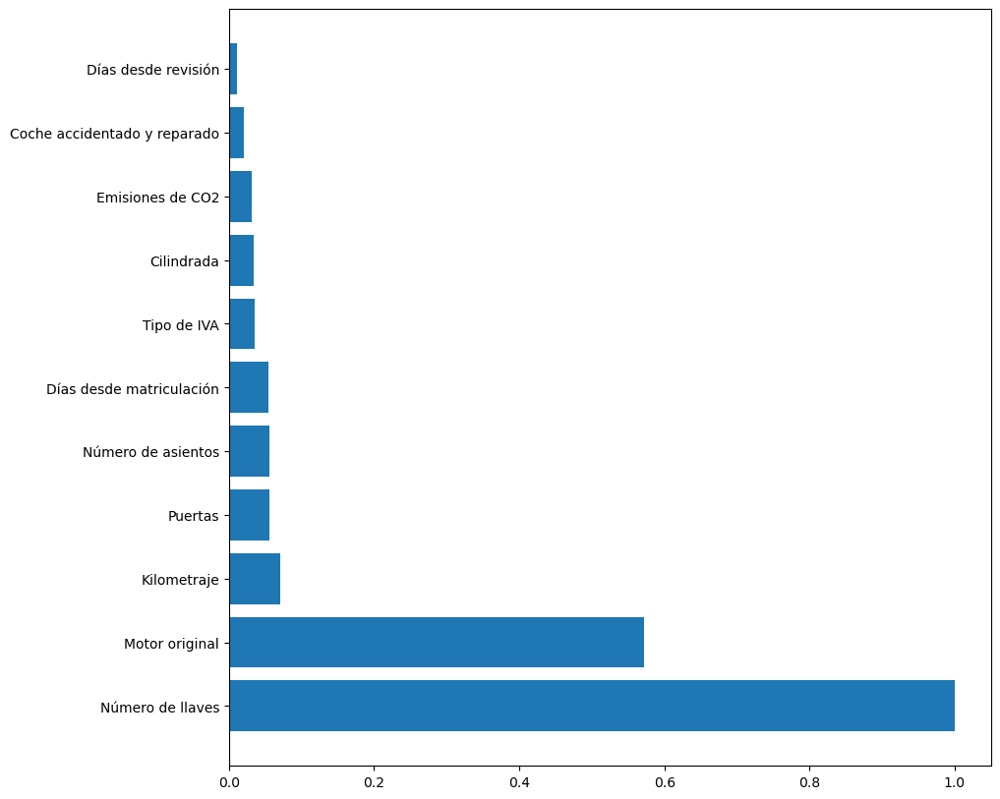

In [187]:
importances = arbol2.feature_importances_
importances = importances / np.max(importances) 
pos = np.where(importances>0.01)
importances = importances[pos]
indices = np.argsort(importances)[::-1] 
plt.figure(figsize=(10,10)) 
plt.barh(range(X_train[X_train.columns[indices]].shape[1]),importances[indices]) 
plt.yticks(range(X_train[X_train.columns[indices]].shape[1]),X.columns[indices]) 
plt.show()

¿por qué tiene tanta importancia el número de llaves?

## Boosted trees

In [58]:
start = timeit.default_timer()
# SELECCIÓN DEL MODELO (model selection) 
n_estimators = [1800, 1900,2000,2500]
learning_rate = [0.025,0.029,0.03, 0.035,0.032]
# rejilla de valores posibles que queremos explorar 
param_grid = {'n_estimators': n_estimators,'learning_rate': learning_rate} 

# Validaremos el modelo mediante validación cruzada en n_folds (este tarda bastante)
n_folds = 5 
grid = GridSearchCV(GradientBoostingRegressor(random_state=0),
                    param_grid=param_grid, cv=5, return_train_score=True) 
grid.fit(X_train, y_train) 
print("best mean cross-validation score: {:.4f}".format(grid.best_score_)) 
print("best parameters: {}".format(grid.best_params_)) 

stop = timeit.default_timer()
print('Time: ', stop - start) 

best mean cross-validation score: 0.8933
best parameters: {'learning_rate': 0.032, 'n_estimators': 1800}
Time:  748.101026999997


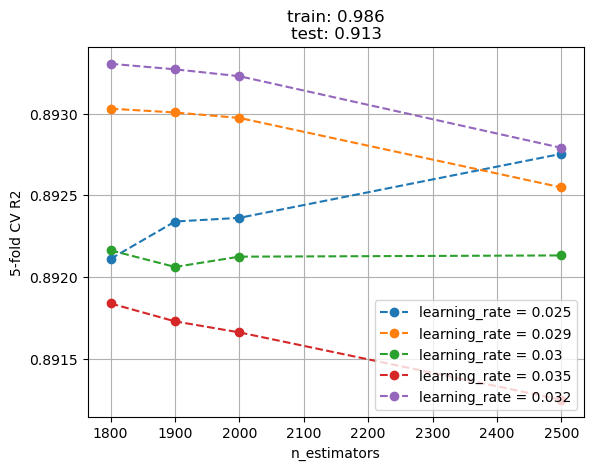

In [59]:
arbol3 = GradientBoostingRegressor(random_state=0,**grid.best_params_).fit(X_train, y_train)
error = grid.cv_results_['mean_test_score'].reshape(len(learning_rate),len(n_estimators)) 
for i, lr in enumerate(list(learning_rate)): 
    plt.plot(n_estimators, error[i],'--o', label='learning_rate = %g'%lr) 
plt.legend() 
plt.xlabel('n_estimators') 
plt.ylabel('{}-fold CV R2'.format(n_folds)) 
plt.title('train: %0.3f\ntest: %0.3f'%(arbol3.score(X_train, y_train), arbol3.score(X_test, y_test))) 
plt.grid() 
plt.show()

Vamos a fijar n_estimators en 1800, ya que parece que a partir de ahí no mejoramos mucho el resultado

In [55]:
start = timeit.default_timer()
# SELECCIÓN DEL MODELO (model selection) 
# n_estimators = [1800, 1900,2000,2500]
learning_rate = np.arange(0.03, 0.04, 0.001)
max_depth = np.arange(2, 10, 1)
# rejilla de valores posibles que queremos explorar 
param_grid = {'max_depth': max_depth,'learning_rate': learning_rate} 

# Validaremos el modelo mediante validación cruzada en n_folds (este tarda bastante)
n_folds = 5 
grid = GridSearchCV(GradientBoostingRegressor(random_state=0, n_estimators = 1800),
                    param_grid=param_grid, cv=5, return_train_score=True) 
grid.fit(X_train, y_train) 
print("best mean cross-validation score: {:.4f}".format(grid.best_score_)) 
print("best parameters: {}".format(grid.best_params_)) 

stop = timeit.default_timer()
print('Time: ', stop - start) 

best mean cross-validation score: 0.9002
best parameters: {'learning_rate': 0.037000000000000005, 'max_depth': 2}
Time:  5406.2887801998295


Este último modelo es el mejor por ahora

## Máquinas de vectores soporte (SVM)